In [154]:
from visual_behavior.data_access import loading
import visual_behavior.utilities as vbu
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from multiprocessing import Pool
import seaborn as sns
from scipy import stats
import itertools

import visual_behavior_glm.GLM_visualization_tools as gvt
from visual_behavior.visualization import utils as vis_utils

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

In [186]:
%matplotlib notebook
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## get experiment table

In [3]:
et = loading.get_filtered_ophys_experiment_table(release_data_only=True,).reset_index()
sessions = et.drop_duplicates(subset = ['ophys_session_id']).reset_index(drop=True).copy()
sessions = sessions[~sessions['session_type'].str.contains('passive')]
len(sessions)

348

In [4]:
sessions['session_number'] = sessions['session_type'].map(lambda st:st.split('OPHYS_')[1].split('_')[0]).astype(int)

In [5]:
sessions.sample(5)

,ophys_experiment_id,equipment_name,donor_id,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,foraging_id,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,behavior_session_id,ophys_container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,isi_experiment_id,imaging_depth,targeted_structure,published_at,date_of_acquisition,session_type,session_tags,failure_tags,model_outputs_available,location
138,930996073,MESO.1,840355560,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,453988,Ai148(TIT2L-GC6f-ICL-tTA2),['Vip-IRES-Cre'],M,196.0,b47f1238-efb3-4d93-888c-77231bf1b93f,Vip-IRES-Cre,GCaMP6f,1,1,54.0,1.0,929686773,929818797,1026722854,VisualBehaviorMultiscope,published,passed,20190823_453988_1imagesA_retake,848974280,71,VISp,2021-03-25 00:00:00.000000,2019-08-23 08:11:32.653400,OPHYS_1_images_A,NaN,NaN,True,Vip_VISp_71
12,995280513,CAM2P.4,910267431,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,476970,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],M,201.0,9d083baf-ec72-4f0f-8895-1e96b6a09350,Sst-IRES-Cre,GCaMP6f,4,1,1.0,5.0,995115654,995142529,991913453,VisualBehaviorTask1B,published,passed,20191218_476970_4imagesA,918315471,275,VISp,2021-03-25 00:00:00.000000,2019-12-18 19:50:24.000000,OPHYS_4_images_A,NaN,NaN,True,Sst_VISp_275
150,1071440875,CAM2P.4,1050611348,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,544261,Ai148(TIT2L-GC6f-ICL-tTA2),['Vip-IRES-Cre'],F,150.0,968ff5ae-e0d5-4661-bb6d-242bee28c7ac,Vip-IRES-Cre,GCaMP6f,6,2,7.0,11.0,1071202230,1071270468,1064333322,VisualBehavior,published,passed,20201217_544261_Session6,1053467148,175,VISp,2021-03-25 00:00:00.000000,2020-12-17 18:01:12.000000,OPHYS_6_images_B,NaN,NaN,True,Vip_VISp_175
293,822647135,CAM2P.5,789992895,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,431023,Ai93(TITL-GCaMP6f),"['Slc17a7-IRES2-Cre', 'Camk2a-tTA']",M,111.0,9f95f84d-8862-4d2a-aca2-8acd7fd21596,Slc17a7-IRES2-Cre,GCaMP6f,1,3,12.0,12.0,822388759,822439453,812858755,VisualBehavior,published,passed,20190213_431023_VISp_175um_1a,796874559,175,VISp,2021-03-25 00:00:00.000000,2019-02-13 21:33:38.000000,OPHYS_1_images_A,NaN,NaN,True,Slc17a7_VISp_175
454,848697625,CAM2P.3,820878203,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"['Slc17a7-IRES2-Cre', 'Camk2a-tTA']",M,97.0,ac72bef8-27de-4f50-8b10-d878b588ee95,Slc17a7-IRES2-Cre,GCaMP6f,1,0,11.0,0.0,848264483,848613406,846215539,VisualBehavior,published,passed,20190409_445002_1imagesA,828776452,375,VISp,2021-03-25 00:00:00.000000,2019-04-09 17:15:25.000000,OPHYS_1_images_A,NaN,NaN,True,Slc17a7_VISp_375


## load behavior model summary

In [6]:
datafolder = '/allen/programs/braintv/workgroups/nc-ophys/visual_behavior/behavior_model_output'
ophys_summary_table = pd.read_csv(os.path.join(datafolder, '_summary_table.csv'))
behavior_summary_table = pd.read_csv(os.path.join(datafolder, '_training_summary_table.csv'))

In [7]:
ophys_summary_table.sample(5)

,ophys_session_id,behavior_session_id,container_id,project_code,container_workflow_state,session_type,equipment_name,date_of_acquisition,isi_experiment_id,specimen_id,donor_id,sex,age_in_days,full_genotype,mouse_id,reporter_line,driver_line,targeted_structure,published_at,super_container_id,cre_line,session_tags,failure_tags,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,session_number,active,passive,trained_A,trained_B,behavior_fit_available,num_hits,num_fa,num_cr,num_miss,num_aborts,fraction_engaged,session_roc,lick_fraction,lick_fraction_1st_half,lick_fraction_2nd_half,lick_hit_fraction,lick_hit_fraction_1st_half,lick_hit_fraction_2nd_half,trial_hit_fraction,trial_hit_fraction_1st_half,trial_hit_fraction_2nd_half,strategy_dropout_index,visual_only_dropout_index,timing_only_dropout_index,prior_bias,dropout_bias,avg_weight_bias,avg_weight_bias_1st_half,avg_weight_bias_2nd_half,prior_omissions,dropout_omissions,avg_weight_omissions,avg_weight_omissions_1st_half,avg_weight_omissions_2nd_half,weight_omissions,prior_omissions1,dropout_omissions1,avg_weight_omissions1,avg_weight_omissions1_1st_half,avg_weight_omissions1_2nd_half,prior_task0,dropout_task0,avg_weight_task0,avg_weight_task0_1st_half,avg_weight_task0_2nd_half,prior_timing1D,dropout_timing1D,avg_weight_timing1D,avg_weight_timing1D_1st_half,avg_weight_timing1D_2nd_half,strategy_weight_index,strategy_weight_index_1st_half,strategy_weight_index_2nd_half,visual_strategy_session,container_in_order,full_active_container,strategy_matched
83,1046877416,1046904233,1045477185,VisualBehaviorTask1B,published,OPHYS_1_images_B,CAM2P.4,2020-08-28 18:41:21.000000,1036282585,1032508324,1032508314,M,105.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,533161,['Ai93(TITL-GCaMP6f)'],"['Slc17a7-IRES2-Cre', 'Camk2a-tTA']",VISp,2021-03-25 00:00:00.000000,1032508324,Slc17a7-IRES2-Cre,NaN,NaN,0,13.0,0.0,1,True,False,False,True,True,128.0,7.0,32.0,156.0,248.0,0.739575,0.865620,0.087417,0.131630,0.047074,0.336842,0.355311,0.289720,0.450704,0.782258,0.193750,5.326365,-14.332933,-9.006568,0.080439,-54.105502,-2.893737,-2.306452,-3.429606,0.003815,0.042436,-1.203293,-1.209812,-1.197344,[-1.2172536 -1.21725373 -1.21725337 ... -1.19...,0.028925,-1.310814,1.110817,1.785601,0.495109,0.025564,-14.332933,2.590074,3.204453,2.029483,0.271235,-9.006568,0.685949,3.014016,-1.438297,1.904125,0.190437,3.467780,True,True,True,False
249,871526950,871808378,1018027611,VisualBehaviorMultiscope,published,OPHYS_3_images_A,MESO.1,2019-05-20 08:53:27.000000,846102910,837628436,837628429,M,122.0,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,449653,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Vip-IRES-Cre'],VISl,2021-03-25 00:00:00.000000,837628436,Vip-IRES-Cre,NaN,percent_change_intensity,0,14.0,2.0,3,True,False,True,False,True,84.0,4.0,19.0,78.0,603.0,0.898874,0.831021,0.165330,0.208436,0.125398,0.119829,0.110588,0.134058,0.518519,0.824561,0.352381,-17.350809,-1.108353,-18.459162,0.080752,-21.064601,-1.691510,-1.137309,-2.204921,0.034187,0.030522,-0.591410,-1.231878,0.001917,[-1.86978917 -1.86980249 -1.8698206 ... 0.55...,0.001153,-0.084034,0.806517,0.806673,0.806372,0.002077,-1.108353,1.406805,1.413301,1.400788,0.295575,-18.459162,2.781768,4.286723,1.387583,-1.374963,-2.873421,0.013205,False,True,False,False
180,981863572,981957849,975371413,VisualBehaviorTask1B,published,OPHYS_4_images_A,CAM2P.3,2019-11-13 21:54:34.000000,918315422,910248639,910248630,M,164.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,477202,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],VISp,2021-03-25 00:00:00.000000,910248639,Sst-IRES-Cre,NaN,NaN,0,0.0,4.0,4,True,False,False,True,True,31.0,3.0,22.0,156.0,759.0,0.991473,0.619680,0.179504,0.194382,0.165296,0.038224,0.034965,0.041885,0.165775,0.178571,0.155340,-0.232085,0.203533,-0.028553,0.079972,-19.057988,-1.390468,-1.318249,-1.459438,0.000875,0.192001,0.165673,0.164599,0.166699,[0.16366561 0.16366561 0.16366562 ... 0.166941...,0.001310,0.131681,0.363483,0.365

<IPython.core.display.Javascript object>


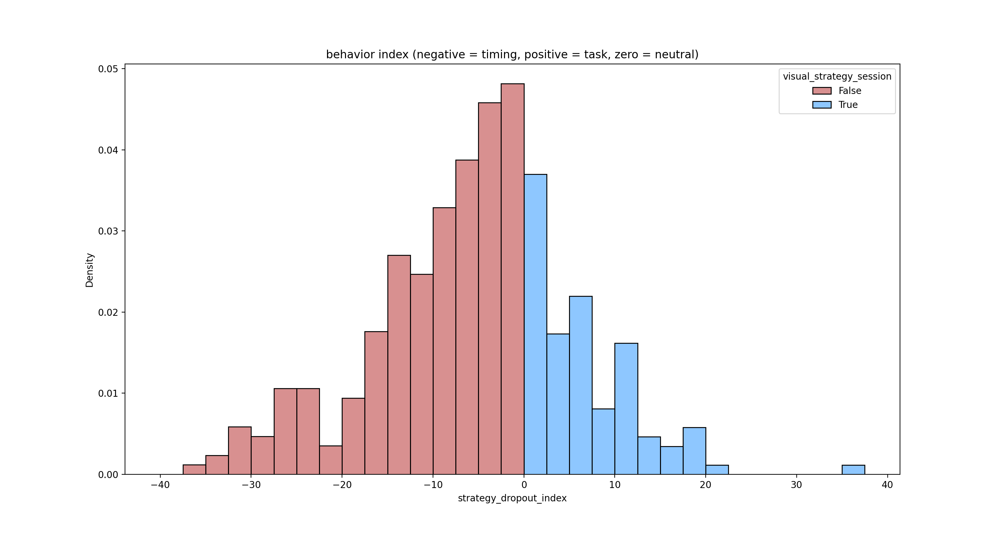

Text(0.5, 1.0, 'behavior index (negative = timing, positive = task, zero = neutral)')

In [8]:
fig,ax = plt.subplots(figsize = (15,8))
sns.histplot(
    data = ophys_summary_table,
    x = 'strategy_dropout_index',
    hue = 'visual_strategy_session',
    ax = ax,
    stat='density',
    bins = np.arange(-40,40,2.5),
    palette = ['firebrick', 'dodgerblue']
)
ax.set_title('behavior index (negative = timing, positive = task, zero = neutral)')

## create a function to get behavior stats from every session, parallelize acquisition of stats across all sessions

In [9]:
def get_behavior_stats(ophys_experiment_id, engaged_only=True):
    try:
        session = loading.get_ophys_dataset(ophys_experiment_id)
        trials = session.extended_trials
        
        output_dict = {'ophys_experiment_id': ophys_experiment_id}
        output_dict.update({'response_latency_{}'.format(key):value for key,value in trials.query('hit and engaged')['response_latency'].describe().to_dict().items()})

        output_dict['hit_rate'] = trials.query('go and engaged')['hit'].mean()
        output_dict['fa_rate'] = trials.query('catch and engaged')['false_alarm'].mean()
        output_dict['number_of_engaged_go_trials'] = len(trials.query('go and engaged'))
        output_dict['number_of_engaged_hits'] = trials.query('go and engaged')['hit'].sum()
        output_dict['number_of_engaged_catch_trials'] = len(trials.query('catch and engaged'))
        output_dict['number_of_engaged_false_alarms'] = trials.query('catch and engaged')['false_alarm'].sum()
        output_dict['fraction_engaged'] = trials.query('go or catch')['engaged'].mean()
        output_dict['dprime_trial_corrected'] = vbu.dprime(
            go_trials = trials.query('go and engaged')['hit'], 
            catch_trials = trials.query('catch and engaged')['false_alarm'], 
            limits=True
        )
        output_dict['dprime_non_trial_corrected'] = vbu.dprime(
            go_trials = trials.query('go and engaged')['hit'], 
            catch_trials = trials.query('catch and engaged')['false_alarm'], 
            limits=False
        )
        return output_dict
    except:
        return {'ophys_experiment_id': ophys_experiment_id}

#### call the above function for every ophys session. This takes 10 or so minutes to run with 32 processes.

In [16]:
with Pool(28) as pool:
    behavior_df = pd.DataFrame(pool.map(get_behavior_stats, sessions['ophys_experiment_id']))

model outputs not available
model outputs not available


model outputs not available


model outputs not available


In [10]:
ophys_experiment_id = 951980473
session = loading.get_ophys_dataset(ophys_experiment_id)
trials = session.extended_trials

In [11]:
esp = session.extended_stimulus_presentations

In [12]:
get_behavior_stats(951980473)

{'ophys_experiment_id': 951980473,
 'response_latency_count': 65.0,
 'response_latency_mean': 0.3679168345154984,
 'response_latency_std': 0.15176521296151668,
 'response_latency_min': -0.05319455009998819,
 'response_latency_25%': 0.3137554498998725,
 'response_latency_50%': 0.3971154499004115,
 'response_latency_75%': 0.4638854499003173,
 'response_latency_max': 0.6974154499002907,
 'hit_rate': 0.5327868852459017,
 'fa_rate': 0.2,
 'number_of_engaged_go_trials': 122,
 'number_of_engaged_hits': 65,
 'number_of_engaged_catch_trials': 20,
 'number_of_engaged_false_alarms': 4,
 'fraction_engaged': 0.6794258373205742,
 'dprime_trial_corrected': 0.9238985029826878,
 'dprime_non_trial_corrected': 0.9238985029826878}

In [31]:
trials['engagement_state'].value_counts()

disengaged    759
Name: engagement_state, dtype: int64

In [28]:
esp['engagement_state'].value_counts()

engaged       3874
disengaged     927
Name: engagement_state, dtype: int64

In [17]:
behavior_df.at[behavior_df.query('number_of_engaged_hits <= 5').index, 'dprime_trial_corrected'] = np.nan

In [18]:
behavior_df['engaged_hit_rate'] = behavior_df['number_of_engaged_hits']/behavior_df['number_of_engaged_go_trials']
behavior_df['engaged_fa_rate'] = behavior_df['number_of_engaged_false_alarms']/behavior_df['number_of_engaged_catch_trials']

## merge in session metadata

In [19]:
behavior_df = behavior_df.merge(
    sessions,
    left_on = 'ophys_experiment_id',
    right_on = 'ophys_experiment_id'
)

In [20]:
behavior_df.head()

,ophys_experiment_id,response_latency_count,response_latency_mean,response_latency_std,response_latency_min,response_latency_25%,response_latency_50%,response_latency_75%,response_latency_max,hit_rate,fa_rate,number_of_engaged_go_trials,number_of_engaged_hits,number_of_engaged_catch_trials,number_of_engaged_false_alarms,fraction_engaged,dprime_trial_corrected,dprime_non_trial_corrected,engaged_hit_rate,engaged_fa_rate,equipment_name,donor_id,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,foraging_id,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,behavior_session_id,ophys_container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,isi_experiment_id,imaging_depth,targeted_structure,published_at,date_of_acquisition,session_type,session_tags,failure_tags,model_outputs_available,location
0,958527471,53.0,0.422242,0.169722,-0.035992,0.364268,0.464408,0.514468,0.714638,0.514563,0.083333,103.0,53.0,12.0,1.0,0.372168,1.419507,1.419507,0.514563,0.083333,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,210.0,0210d6f7-93f7-4bc1-a622-5c22b1daa11c,Sst-IRES-Cre,GCaMP6f,3,0,67.0,2.0,954954402,953982960,1018028345,VisualBehaviorMultiscope,published,passed,20190924_457841_3imagesA,858992726,225,VISp,2021-03-25 00:00:00.000000,2019-09-24 16:00:00.000000,OPHYS_3_images_A,NaN,NaN,True,Sst_VISp_225
1,957759576,70.0,0.446784,0.125046,0.030732,0.397652,0.439382,0.514462,0.714622,0.666667,0.133333,105.0,70.0,15.0,2.0,0.418118,1.541499,1.541499,0.666667,0.133333,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,213.0,40897cd4-3279-4a2d-b65d-b3f984e34e17,Sst-IRES-Cre,GCaMP6f,4,0,0.0,4.0,957020350,957032492,1018028360,VisualBehaviorMultiscope,published,passed,20190927_457841_4imagesB,858992726,300,VISl,2021-03-25 00:00:00.000000,2019-09-27 08:28:05.415005,OPHYS_4_images_B,NaN,NaN,True,Sst_VISl_300
2,956941841,56.0,0.436431,0.131464,-0.019297,0.393495,0.464443,0.514485,0.697993,0.444444,0.250000,126.0,56.0,16.0,4.0,0.535849,0.534779,0.534779,0.444444,0.250000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,212.0,2a4ef1a6-4c8a-4d37-bfca-b7d4a166daf2,Sst-IRES-Cre,GCaMP6f,3,1,68.0,3.0,955775716,956010809,1018028342,VisualBehaviorMultiscope,published,passed,20190926_457841_3imagesA,858992726,150,VISp,2021-03-25 00:00:00.000000,2019-09-26 08:44:37.199778,OPHYS_3_images_A,NaN,"parent_averaged_depth_image_6,parent_averaged_...",True,Sst_VISp_150
3,960410026,77.0,0.345930,0.157424,-0.035981,0.314299,0.381009,0.447709,0.614539,0.693694,0.400000,111.0,77.0,15.0,6.0,0.642857,0.759695,0.759695,0.693694,0.400000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,218.0,4bda6fef-467c-47cc-b713-ec012b2eb90e,Sst-IRES-Cre,GCaMP6f,6,0,2.0,7.0,959458018,959681045,1018028345,VisualBehaviorMultiscope,published,passed,20191002_457841_6imagesB,858992726,225,VISp,2021-03-25 00:00:00.000000,2019-10-02 08:52:18.346563,OPHYS_6_images_B,NaN,z_drift_corr_um_diff,True,Sst_VISp_225
4,951980475,65.0,0.367917,0.151765,-0.053195,0.313755,0.397115,0.463885,0.697415,0.532787,0.200000,122.0,65.0,20.0,4.0,0.679426,0.923899,0.923899,0.532787,0.200000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,206.0,592420fb-911d-41c5-8763-4ebdeb0ef416,Sst-IRES-Cre,GCaMP6f,1,0,65.0,0.0,951410079,951520319,1018028339,VisualBehaviorMultiscope,published,passed,20190920_457841_1imagesA_2,848974280,75,VISp,2021-03-25 00:00:00.000000,2019-09-20 09:45:29.897856,OPHYS_1_images_A,NaN,NaN,True,Sst_VISp_75


<IPython.core.display.Javascript object>


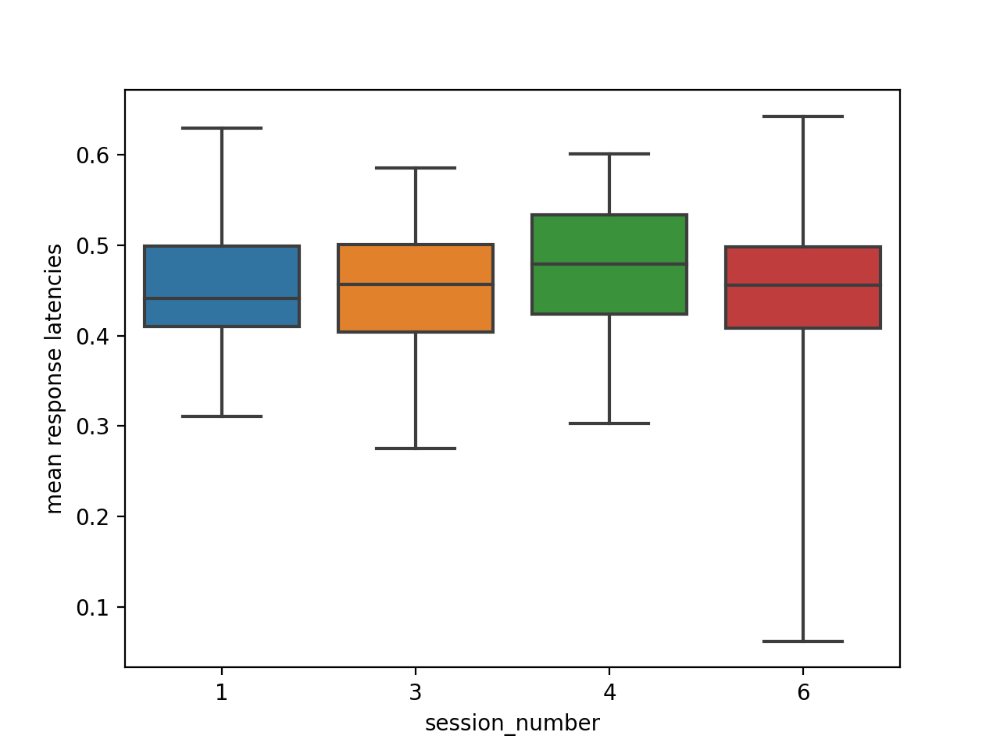

Text(0, 0.5, 'mean response latencies')

In [21]:
fig, ax = plt.subplots()

sns.boxplot(
    data = behavior_df.query('prior_exposures_to_session_type == 0 and session_number in [1,3,4,6]'),
    x = 'session_number',
    y = 'response_latency_mean',
    whis = np.inf,
    ax = ax,
)
ax.set_ylabel('mean response latencies')

<IPython.core.display.Javascript object>


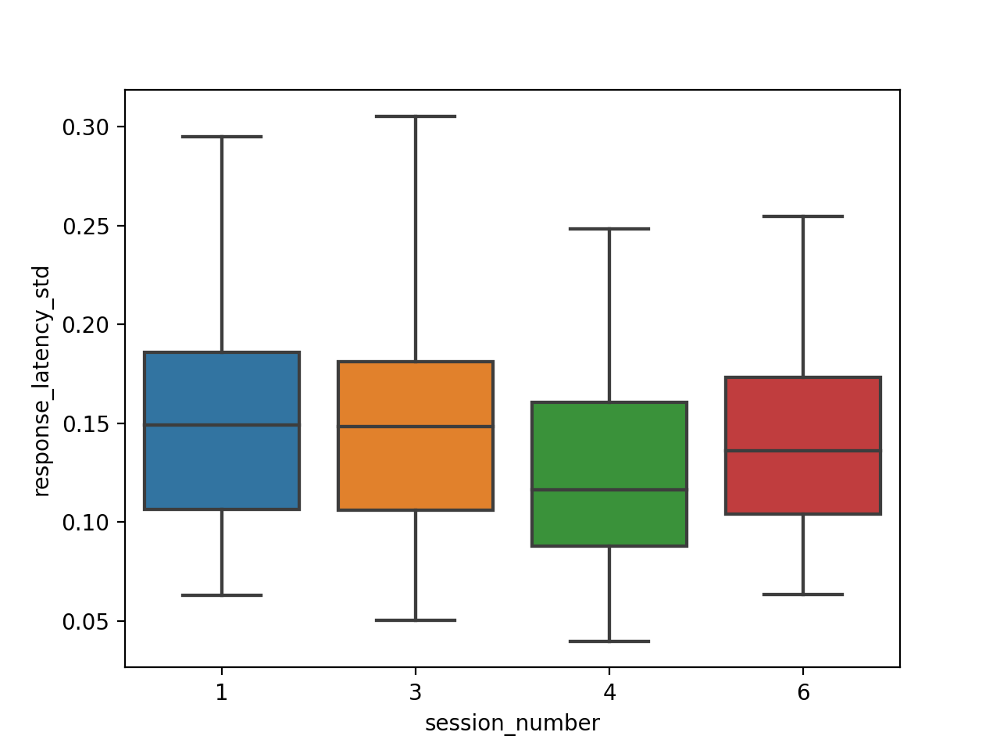

Text(0, 0.5, 'std of response latencies')

In [22]:
fig, ax = plt.subplots()

sns.boxplot(
    data = behavior_df.query('prior_exposures_to_session_type == 0 and session_number in [1,3,4,6]'),
    x = 'session_number',
    y = 'response_latency_std',
    whis = np.inf,
    ax = ax,
)
ax.set_ylabel('std of response latencies')

## some functions

In [42]:
def get_comparison_df_wide(input_df, conditions, column_to_compare, suffixes = ['', '_duplicate']):
    '''
    this will build a dataframe that compares conditions for a given mouse
    each mouse will be one row, with one column each representing the value in two conditions
    inputs:
        input_df: dataframe
        conditions: conditions to compare (query strings)
        column_name: columns to compare (string)
    '''
    
    # merge in the ophys_summary_table
    input_df = input_df.merge(
        ophys_summary_table[['behavior_session_id','strategy_dropout_index','visual_strategy_session']],
        left_on = 'behavior_session_id',
        right_on = 'behavior_session_id',
        suffixes = suffixes
    )
    
    # get two dataframes representing the two conditions
    condition_0 = input_df.query(conditions[0])
    condition_1 = input_df.query(conditions[1])

    # merge them together on mouse_id
    comparison_df = condition_0[[column_to_compare,'mouse_id','behavior_session_id']].merge(
        condition_1[[column_to_compare,'mouse_id','cre_line','behavior_session_id']],
        left_on = 'mouse_id',
        right_on = 'mouse_id',
        suffixes = suffixes
    ).dropna()
    
    return comparison_df
    
def get_comparison_df_long(comparison_df, conditions, column_to_compare, suffixes = ['', '_duplicate']):
    '''
    this will build a dataframe that compares conditions for a given mouse
    each mouse will be represented by two rows, one for conditions[0], another for conditions[1]
    inputs:
        comparison_df: dataframe
        conditions: conditions to compare (query strings)
        column_name: columns to compare (string)
    '''

    # melt (unpivot) on mouse and cre line, with values being behavior_session_id
    behavior_session_id_df_melted = pd.melt(
        comparison_df, 
        id_vars=['mouse_id', 'cre_line'], 
        value_vars=['behavior_session_id' + suffixes[0], 'behavior_session_id' + suffixes[1]],
        var_name='stage', 
        value_name='behavior_session_id',
    )

    # melt (unpivot) on mouse and cre line, with values being columns to compare
    comparison_df_melted = pd.melt(
        comparison_df, 
        id_vars=['mouse_id', 'cre_line'], 
        value_vars=[column_to_compare + suffixes[0],column_to_compare + suffixes[1]],
        var_name='stage', 
        value_name=column_to_compare,
    )
    

    # trim off the prefix in the stage column
    for prefix, df in [[column_to_compare, comparison_df_melted], ['behavior_session_id', behavior_session_id_df_melted]]:
        for idx, row in df.iterrows():
            df.at[idx, 'stage'] = row['stage'].split(prefix + '_')[1]

    # merge together the two longform dataframes on mouse_id, cre_line, stage
    comparison_df_melted = comparison_df_melted.merge(
        behavior_session_id_df_melted,
        left_on = ['mouse_id', 'cre_line', 'stage'],
        right_on = ['mouse_id', 'cre_line', 'stage'],
        suffixes = suffixes
    )
    
    # merge in the ophys_summary_table
    comparison_df_melted = comparison_df_melted.merge(
        ophys_summary_table[['behavior_session_id','strategy_dropout_index','visual_strategy_session']],
        left_on = 'behavior_session_id',
        right_on = 'behavior_session_id',
        suffixes = ['', '_duplicated']
    )
    
    return comparison_df_melted

def get_comparison_df(input_df, conditions, column_to_compare, suffixes = ['', '_duplicate']):
    '''
    gets the longform comparision dataframe by first building the wideform dataframe
    '''
    comparison_df_wide = get_comparison_df_wide(input_df, conditions, column_to_compare, suffixes = suffixes)
    comparison_df_long = get_comparison_df_long(comparison_df_wide, conditions, column_to_compare, suffixes = suffixes)
    
    return comparison_df_long

In [146]:
def boxplot_with_lines(ax, data, x, y, palette=['gray','gray'], subjects='mouse_id', color_by_cre_line=True):
    '''
    a function to make a boxplot with lines connecting subjects
    '''
    sns.boxplot(
        data = data,
        x = x,
        y = y,
        ax = ax,
        palette = palette,
        whis = np.inf,
    )
    
    colors = gvt.project_colors()

    for subject in data[subjects].unique():
        data_to_plot = data.query('{} == @subject'.format(subjects))
        if color_by_cre_line:
            color = colors[data_to_plot['cre_line'].unique()[0]]
        else:
            color = 'gray'
        sns.lineplot(
            data = data_to_plot,
            x = x,
            y = y,
            ax = ax,
            color=color,
            alpha=0.75,
            marker = '.',
            linewidth = 2
        )

def make_comparison_plot(comparison_df, x='stage', y=None, xticklabels=None, xlabel=None):
    '''
    a function to make a comparison plot with paired t-test results in title
    '''
    
    fig, ax = plt.subplots(1,4,figsize=(15,5), sharey = True)

    conditions = comparison_df[x].unique()
    
    # get a list of cre_lines
    cre_lines = list(np.sort(comparison_df['cre_line'].unique()))
    
    # make a list of list of lists, first entry is full list, next entries are single-element lists with each line individually
    cre_line_lists = [cre_lines] + [[cre_line] for cre_line in cre_lines]
    
    # now make a plot for every group (either all cre lines, or each cre line individually)
    for ii, cre_line_list in enumerate(cre_line_lists):
        
        if len(cre_line_list) > 1:
            cre_line = 'all'
        else:
            cre_line = cre_line_list[0]
        
        boxplot_with_lines(ax[ii], comparison_df.query('cre_line in @cre_line_list'), x, y, palette=['gray','gray'], subjects='mouse_id')
        
        res = stats.ttest_rel(
            comparison_df.query('cre_line in @cre_line_list and {} == "{}"'.format(x, conditions[0]))[y],
            comparison_df.query('cre_line in @cre_line_list and {} == "{}"'.format(x, conditions[1]))[y]
        )
        ax[ii].set_title('cre_line = {}\np-value = {:0.4f}'.format(cre_line, res.pvalue))
        
        if xticklabels:
            ax[ii].set_xticklabels(xticklabels)
            
        if xlabel:
            ax[ii].set_xlabel(xlabel)

    fig.tight_layout()
    plt.subplots_adjust(top = 0.8)
    fig.suptitle('{} comparisons for stages 3 and 4\np-values are from paired t-tests'.format(y))
    
    return fig, ax

In [149]:
def make_comparison_plot_single(comparison_df, x='stage', y=None, xticklabels=None, xlabel=None, ylabel=None, figsize=(2.5,5), labelpad=10, color_by_cre_line=True, palette=['gray','gray']):
    '''
    a function to make a comparison plot with paired t-test results in title
    '''
    
    fig, ax = plt.subplots(1,1,figsize=figsize, sharey = True)

    conditions = comparison_df[x].unique()
    
    # get a list of cre_lines
    cre_lines = list(np.sort(comparison_df['cre_line'].unique()))
    
    # now make a plot for every group (either all cre lines, or each cre line individually)        
    boxplot_with_lines(ax, comparison_df.query('cre_line in @cre_lines'), x, y, palette=palette, subjects='mouse_id', color_by_cre_line=color_by_cre_line)

    res = stats.ttest_rel(
        comparison_df.query('cre_line in @cre_lines and {} == "{}"'.format(x, conditions[0]))[y],
        comparison_df.query('cre_line in @cre_lines and {} == "{}"'.format(x, conditions[1]))[y]
    )
    ax.set_title('p-value = {:0.4f}'.format(res.pvalue), fontsize=14)

    if xticklabels:
        ax.set_xticklabels(xticklabels)

    if xlabel:
        ax.set_xlabel(xlabel, fontsize=14)
    
    if ylabel is None:
        ylabel = y.replace('_', '\n')
    ax.set_ylabel(ylabel, rotation=0, labelpad=labelpad, fontsize=14, va='center')

    
    plt.subplots_adjust(left = 0.2)
    fig.tight_layout()
#     fig.suptitle('{} comparisons for stages 3 and 4\np-values are from paired t-tests'.format(y))
    
    return fig, ax

## here's an example of the wideform comparison df

In [54]:
comparison_df_wide = get_comparison_df_wide(
    behavior_df, 
    conditions = [
        'prior_exposures_to_session_type == 0 and session_number == 3',
        'prior_exposures_to_session_type == 0 and session_number == 4',
    ],
    column_to_compare = 'response_latency_std',
    suffixes = ['_stage_3', '_stage_4']
)
comparison_df_wide.head()

,response_latency_std_stage_3,mouse_id,behavior_session_id_stage_3,response_latency_std_stage_4,cre_line,behavior_session_id_stage_4
0,0.169722,457841,953982960,0.125046,Sst-IRES-Cre,957032492
1,0.305222,476970,994210659,0.218480,Sst-IRES-Cre,994894518
2,0.149069,412036,794968300,0.190722,Vip-IRES-Cre,795742990
4,0.126606,491060,993957378,0.093066,Slc17a7-IRES2-Cre,994174745
5,0.120627,459777,940553228,0.078631,Slc17a7-IRES2-Cre,941457567


## And an example of the long-form comparison df

In [55]:
comparison_df = get_comparison_df(
    behavior_df, 
    conditions = [
        'prior_exposures_to_session_type == 0 and session_number == 3',
        'prior_exposures_to_session_type == 0 and session_number == 4',
    ],
    column_to_compare = 'response_latency_std',
    suffixes = ['_stage_3', '_stage_4']
)
comparison_df.head()

,mouse_id,cre_line,stage,response_latency_std,behavior_session_id,strategy_dropout_index,visual_strategy_session
0,457841,Sst-IRES-Cre,stage_3,0.169722,953982960,-1.532232,False
1,476970,Sst-IRES-Cre,stage_3,0.305222,994210659,0.091108,True
2,412036,Vip-IRES-Cre,stage_3,0.149069,794968300,-12.191491,False
3,491060,Slc17a7-IRES2-Cre,stage_3,0.126606,993957378,19.450191,True
4,459777,Slc17a7-IRES2-Cre,stage_3,0.120627,940553228,9.087423,True


In [115]:
behavior_df.head()

,ophys_experiment_id,response_latency_count,response_latency_mean,response_latency_std,response_latency_min,response_latency_25%,response_latency_50%,response_latency_75%,response_latency_max,hit_rate,fa_rate,number_of_engaged_go_trials,number_of_engaged_hits,number_of_engaged_catch_trials,number_of_engaged_false_alarms,fraction_engaged,dprime_trial_corrected,dprime_non_trial_corrected,engaged_hit_rate,engaged_fa_rate,equipment_name,donor_id,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,foraging_id,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,behavior_session_id,ophys_container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,isi_experiment_id,imaging_depth,targeted_structure,published_at,date_of_acquisition,session_type,session_tags,failure_tags,model_outputs_available,location
0,958527471,53.0,0.422242,0.169722,-0.035992,0.364268,0.464408,0.514468,0.714638,0.514563,0.083333,103.0,53.0,12.0,1.0,0.372168,1.419507,1.419507,0.514563,0.083333,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,210.0,0210d6f7-93f7-4bc1-a622-5c22b1daa11c,Sst-IRES-Cre,GCaMP6f,3,0,67.0,2.0,954954402,953982960,1018028345,VisualBehaviorMultiscope,published,passed,20190924_457841_3imagesA,858992726,225,VISp,2021-03-25 00:00:00.000000,2019-09-24 16:00:00.000000,OPHYS_3_images_A,NaN,NaN,True,Sst_VISp_225
1,957759576,70.0,0.446784,0.125046,0.030732,0.397652,0.439382,0.514462,0.714622,0.666667,0.133333,105.0,70.0,15.0,2.0,0.418118,1.541499,1.541499,0.666667,0.133333,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,213.0,40897cd4-3279-4a2d-b65d-b3f984e34e17,Sst-IRES-Cre,GCaMP6f,4,0,0.0,4.0,957020350,957032492,1018028360,VisualBehaviorMultiscope,published,passed,20190927_457841_4imagesB,858992726,300,VISl,2021-03-25 00:00:00.000000,2019-09-27 08:28:05.415005,OPHYS_4_images_B,NaN,NaN,True,Sst_VISl_300
2,956941841,56.0,0.436431,0.131464,-0.019297,0.393495,0.464443,0.514485,0.697993,0.444444,0.250000,126.0,56.0,16.0,4.0,0.535849,0.534779,0.534779,0.444444,0.250000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,212.0,2a4ef1a6-4c8a-4d37-bfca-b7d4a166daf2,Sst-IRES-Cre,GCaMP6f,3,1,68.0,3.0,955775716,956010809,1018028342,VisualBehaviorMultiscope,published,passed,20190926_457841_3imagesA,858992726,150,VISp,2021-03-25 00:00:00.000000,2019-09-26 08:44:37.199778,OPHYS_3_images_A,NaN,"parent_averaged_depth_image_6,parent_averaged_...",True,Sst_VISp_150
3,960410026,77.0,0.345930,0.157424,-0.035981,0.314299,0.381009,0.447709,0.614539,0.693694,0.400000,111.0,77.0,15.0,6.0,0.642857,0.759695,0.759695,0.693694,0.400000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,218.0,4bda6fef-467c-47cc-b713-ec012b2eb90e,Sst-IRES-Cre,GCaMP6f,6,0,2.0,7.0,959458018,959681045,1018028345,VisualBehaviorMultiscope,published,passed,20191002_457841_6imagesB,858992726,225,VISp,2021-03-25 00:00:00.000000,2019-10-02 08:52:18.346563,OPHYS_6_images_B,NaN,z_drift_corr_um_diff,True,Sst_VISp_225
4,951980475,65.0,0.367917,0.151765,-0.053195,0.313755,0.397115,0.463885,0.697415,0.532787,0.200000,122.0,65.0,20.0,4.0,0.679426,0.923899,0.923899,0.532787,0.200000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,206.0,592420fb-911d-41c5-8763-4ebdeb0ef416,Sst-IRES-Cre,GCaMP6f,1,0,65.0,0.0,951410079,951520319,1018028339,VisualBehaviorMultiscope,published,passed,20190920_457841_1imagesA_2,848974280,75,VISp,2021-03-25 00:00:00.000000,2019-09-20 09:45:29.897856,OPHYS_1_images_A,NaN,NaN,True,Sst_VISp_75


In [120]:
behavior_df['hit_rate']

0      0.514563
1      0.666667
2      0.444444
3      0.693694
4      0.532787
5      0.571429
6      0.261905
7      0.090909
8      0.200000
9      0.357724
10     0.079365
11     0.141026
12     0.428571
13     0.709924
14     0.666667
15     0.679012
16          NaN
17     0.076923
18          NaN
19          NaN
20     0.000000
21     0.052632
22     0.250936
23     0.446254
24     0.132231
25     0.000000
26     0.440000
27     0.806452
28     0.672811
29     0.627660
30     0.551515
31     0.731429
32     0.317568
33     0.502890
34     0.584615
35     0.645161
36     0.416974
37     0.407407
38     0.748092
39     0.742188
40     0.619835
41     0.557214
42     0.595000
43     0.411765
44     0.509615
45     0.653409
46     0.574713
47     0.055556
48     0.709677
49     0.631579
50     0.700000
51     0.853774
52     0.781609
53     0.875817
54     0.728111
55     0.745763
56     0.285714
57     0.400000
58     0.896552
59     0.362963
60     0.618705
61     0.556180
62     0

<IPython.core.display.Javascript object>


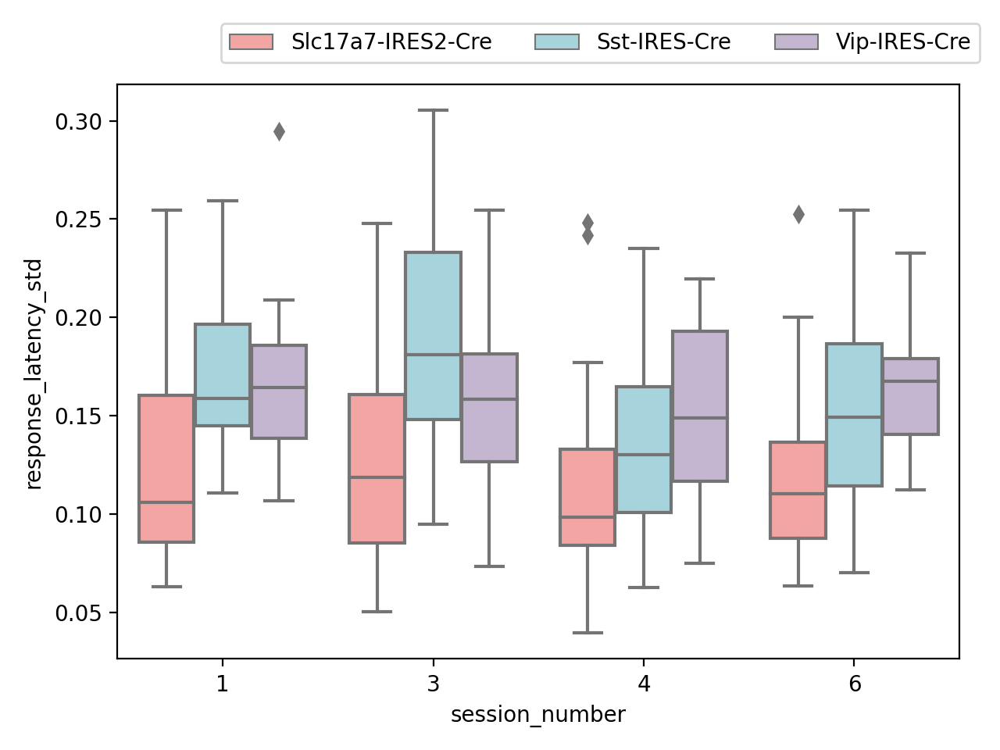

In [137]:
fig, ax = plt.subplots()

colors = gvt.project_colors()

sns.boxplot(
    data = behavior_df.query('prior_exposures_to_session_type == 0 and session_number in [1,3,4,6]'),
    x = 'session_number',
    y = 'response_latency_std',
    hue= 'cre_line',
    hue_order = np.sort(behavior_df['cre_line'].unique()),
    palette = [colors[cre_line] for cre_line in np.sort(behavior_df['cre_line'].unique())],
#     whis = np.inf,
    ax = ax,
)

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=4, borderaxespad=1, ncol=3)

fig.tight_layout()

<IPython.core.display.Javascript object>


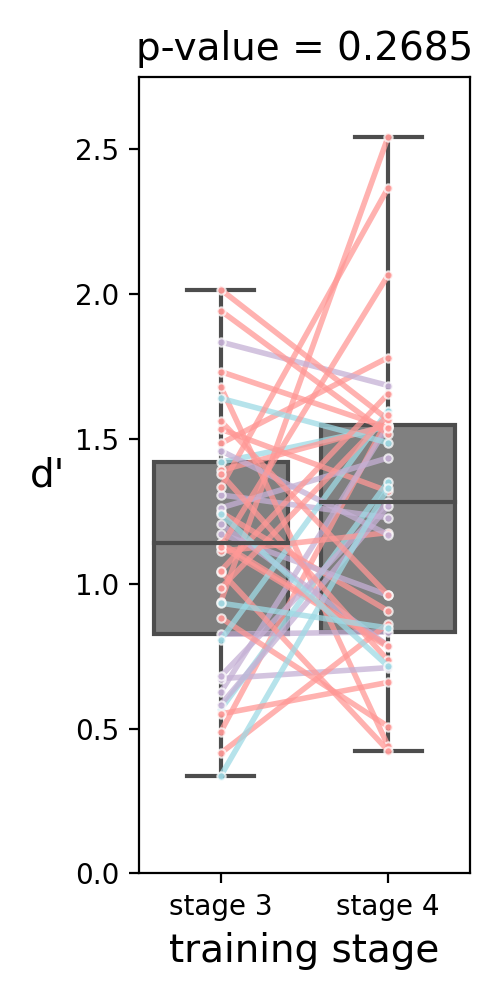

(0.0, 2.75)

In [143]:
comparison = 'dprime_trial_corrected'
comparison_df = get_comparison_df(
    behavior_df, 
    [
        'prior_exposures_to_session_type == 0 and session_number == 3 and dprime_trial_corrected > 0.3',
        'prior_exposures_to_session_type == 0 and session_number == 4 and dprime_trial_corrected > 0.3',
    ],
    column_to_compare = comparison,
    suffixes = ['_stage_3', '_stage_4']
)
fig, ax = make_comparison_plot_single(comparison_df, y=comparison, xticklabels=['stage 3', 'stage 4'], xlabel='training stage', ylabel="d'");
ax.set_ylim(0, 2.75)

<IPython.core.display.Javascript object>


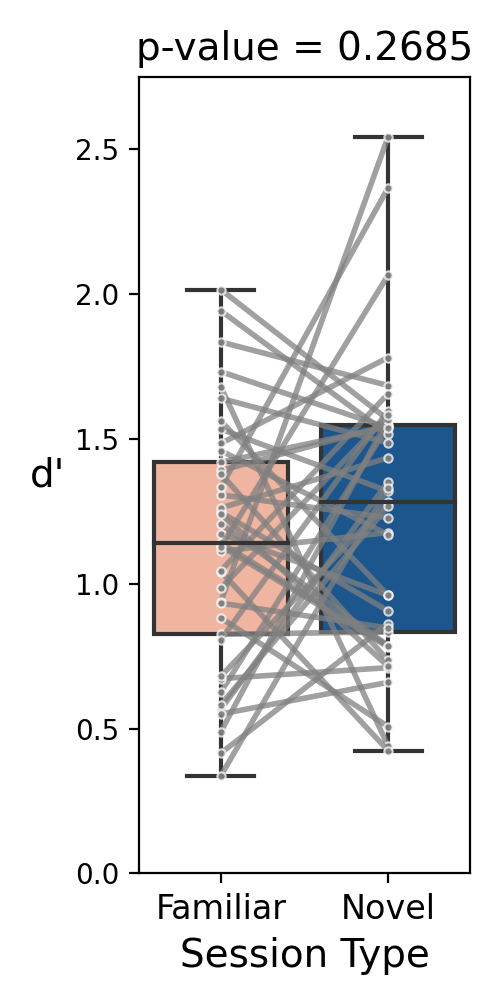

p-value for dprime_trial_corrected in cre_line Sst-IRES-Cre is 0.2559706297159614
p-value for dprime_trial_corrected in cre_line Vip-IRES-Cre is 0.398705250076552
p-value for dprime_trial_corrected in cre_line Slc17a7-IRES2-Cre is 0.7339719287652235


In [183]:
comparison = 'dprime_trial_corrected'
comparison_df = get_comparison_df(
    behavior_df, 
    [
        'prior_exposures_to_session_type == 0 and session_number == 3 and dprime_trial_corrected > 0.3',
        'prior_exposures_to_session_type == 0 and session_number == 4 and dprime_trial_corrected > 0.3',
    ],
    column_to_compare = comparison,
    suffixes = ['_stage_3', '_stage_4']
)
fig, ax = make_comparison_plot_single(
    comparison_df, 
    y=comparison, 
    xticklabels=['stage 3', 'stage 4'], 
    xlabel='training stage', 
    ylabel="d'",
    color_by_cre_line=False,
    palette=[
        vis_utils.get_session_type_color_map()['OPHYS_3_images_A']/255,
        vis_utils.get_session_type_color_map()['OPHYS_4_images_B']/255
    ]
);
ax.set_xticklabels(['Familiar','Novel'], fontsize=12)
ax.set_xlabel('Session Type')
ax.set_ylim(0, 2.75)

for cre_line in comparison_df['cre_line'].unique():
    df = comparison_df.query('cre_line == @cre_line')
    pvalue = stats.ttest_rel(
        df.query('stage == "stage_3"')[comparison], 
        df.query('stage == "stage_4"')[comparison]
    ).pvalue
    print('p-value for {} in cre_line {} is {}'.format(comparison, cre_line, pvalue))

<IPython.core.display.Javascript object>


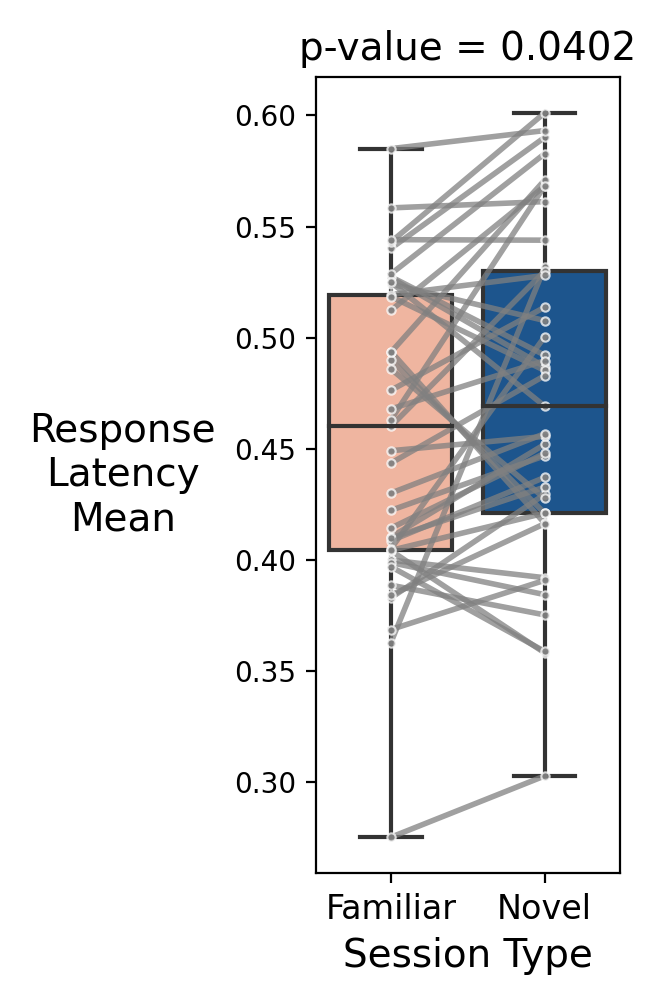

Text(0.5, 25.722222222222214, 'Session Type')

In [167]:
comparison = 'response_latency_mean'
comparison_df = get_comparison_df(
    behavior_df, 
    [
        'prior_exposures_to_session_type == 0 and session_number == 3 and dprime_trial_corrected > 0.3',
        'prior_exposures_to_session_type == 0 and session_number == 4 and dprime_trial_corrected > 0.3',
    ],
    column_to_compare = comparison,
    suffixes = ['_stage_3', '_stage_4']
)
fig, ax = make_comparison_plot_single(
    comparison_df, 
    y=comparison, 
    xticklabels=['stage 3', 'stage 4'], 
    xlabel='training stage', 
    ylabel="Response\nLatency\nMean",
    figsize=(3.25,5), 
    labelpad=40,
    color_by_cre_line=False,
    palette=[
        vis_utils.get_session_type_color_map()['OPHYS_3_images_A']/255,
        vis_utils.get_session_type_color_map()['OPHYS_4_images_B']/255
    ]
);
ax.set_xticklabels(['Familiar','Novel'], fontsize=12)
ax.set_xlabel('Session Type')
# ax.set_ylim(0, 2.75)

<IPython.core.display.Javascript object>


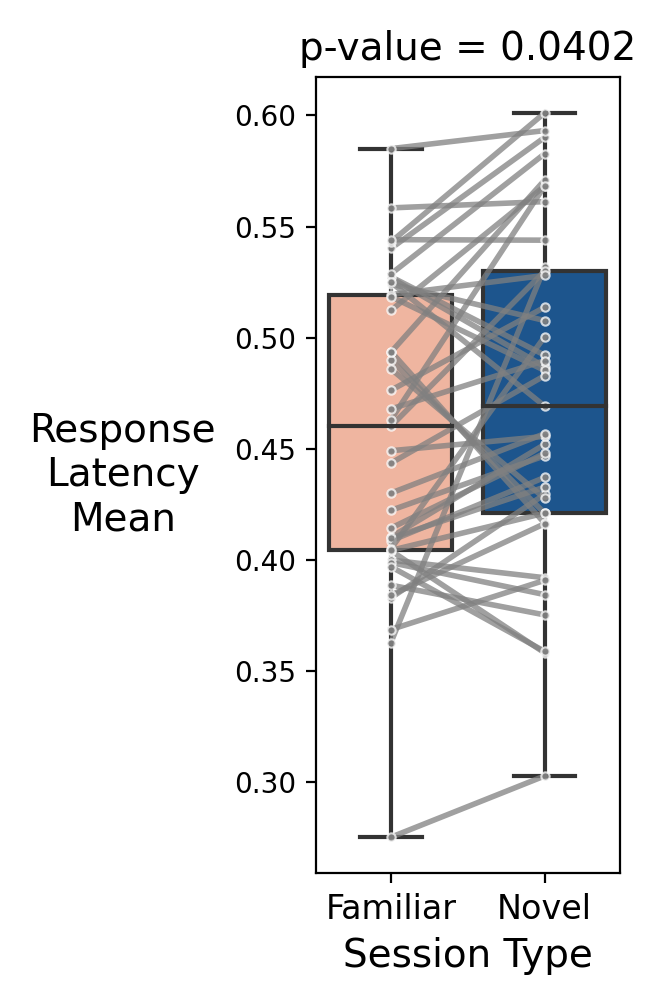

p-value for response_latency_mean in cre_line Sst-IRES-Cre is 0.19601318252089642
p-value for response_latency_mean in cre_line Vip-IRES-Cre is 0.1941698801530098
p-value for response_latency_mean in cre_line Slc17a7-IRES2-Cre is 0.2630371173423691


In [182]:
comparison = 'response_latency_mean'
comparison_df = get_comparison_df(
    behavior_df, 
    [
        'prior_exposures_to_session_type == 0 and session_number == 3 and dprime_trial_corrected > 0.3',
        'prior_exposures_to_session_type == 0 and session_number == 4 and dprime_trial_corrected > 0.3',
    ],
    column_to_compare = comparison,
    suffixes = ['_stage_3', '_stage_4']
)
fig, ax = make_comparison_plot_single(
    comparison_df, 
    y=comparison, 
    xticklabels=['stage 3', 'stage 4'], 
    xlabel='training stage', 
    ylabel="Response\nLatency\nMean",
    figsize=(3.25,5), 
    labelpad=40,
    color_by_cre_line=False,
    palette=[
        vis_utils.get_session_type_color_map()['OPHYS_3_images_A']/255,
        vis_utils.get_session_type_color_map()['OPHYS_4_images_B']/255
    ]
);
ax.set_xticklabels(['Familiar','Novel'], fontsize=12)
ax.set_xlabel('Session Type')

for cre_line in comparison_df['cre_line'].unique():
    df = comparison_df.query('cre_line == @cre_line')
    pvalue = stats.ttest_rel(
        df.query('stage == "stage_3"')[comparison], 
        df.query('stage == "stage_4"')[comparison]
    ).pvalue
    print('p-value for {} in cre_line {} is {}'.format(comparison, cre_line, pvalue))

<IPython.core.display.Javascript object>


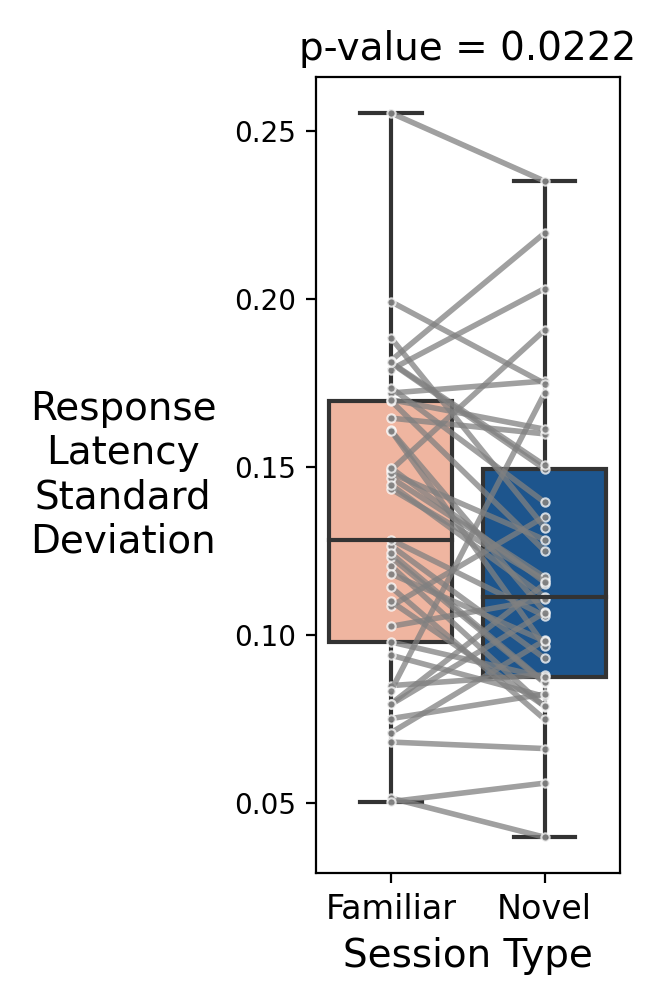

p-value for response_latency_std in cre_line Sst-IRES-Cre is 0.0007264830870471104
p-value for response_latency_std in cre_line Vip-IRES-Cre is 0.983209567066744
p-value for response_latency_std in cre_line Slc17a7-IRES2-Cre is 0.11927263773102935


In [181]:
comparison = 'response_latency_std'
comparison_df = get_comparison_df(
    behavior_df, 
    [
        'prior_exposures_to_session_type == 0 and session_number == 3 and dprime_trial_corrected > 0.3',
        'prior_exposures_to_session_type == 0 and session_number == 4 and dprime_trial_corrected > 0.3',
    ],
    column_to_compare = comparison,
    suffixes = ['_stage_3', '_stage_4']
)
fig, ax = make_comparison_plot_single(
    comparison_df, 
    y=comparison, 
    xticklabels=['stage 3', 'stage 4'], 
    xlabel='training stage', 
    ylabel="Response\nLatency\nStandard\nDeviation",
    figsize=(3.25,5), 
    labelpad=40,
    color_by_cre_line=False,
    palette=[
        vis_utils.get_session_type_color_map()['OPHYS_3_images_A']/255,
        vis_utils.get_session_type_color_map()['OPHYS_4_images_B']/255
    ]
);
ax.set_xticklabels(['Familiar','Novel'], fontsize=12)
ax.set_xlabel('Session Type')

for cre_line in comparison_df['cre_line'].unique():
    df = comparison_df.query('cre_line == @cre_line')
    pvalue = stats.ttest_rel(
        df.query('stage == "stage_3"')[comparison], 
        df.query('stage == "stage_4"')[comparison]
    ).pvalue
    print('p-value for {} in cre_line {} is {}'.format(comparison, cre_line, pvalue))

In [184]:
print(1)

1


## now make a comparison plot for a number of conditions

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


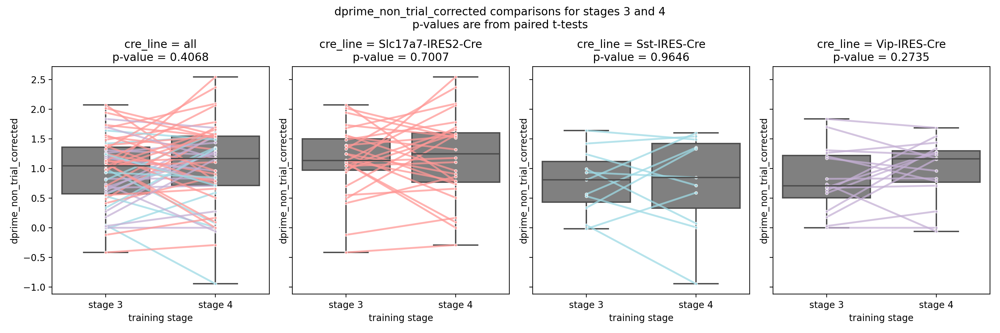

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


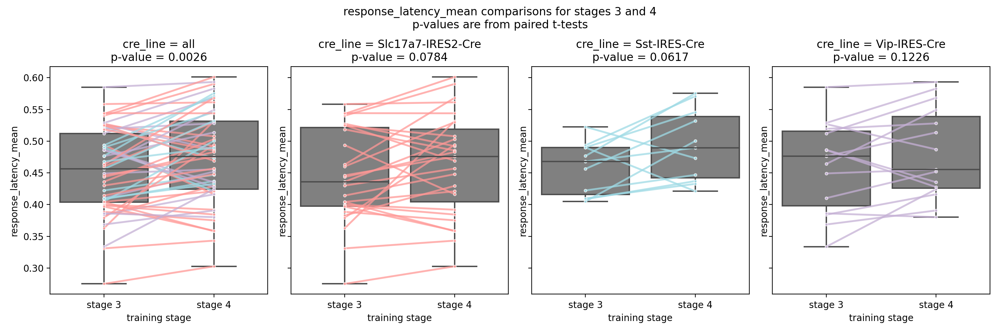

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


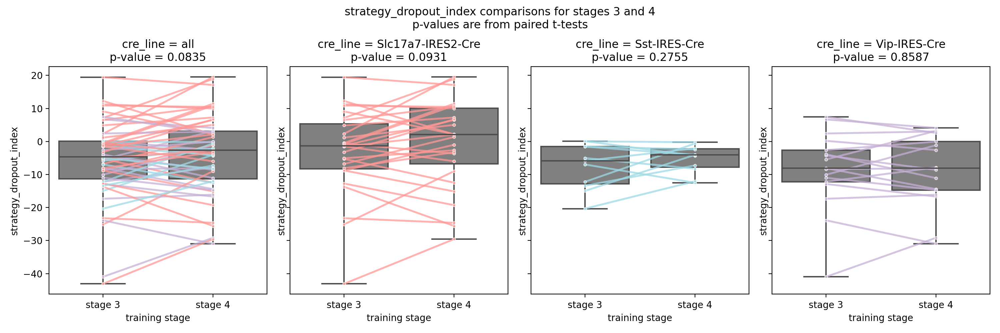

<IPython.core.display.Javascript object>


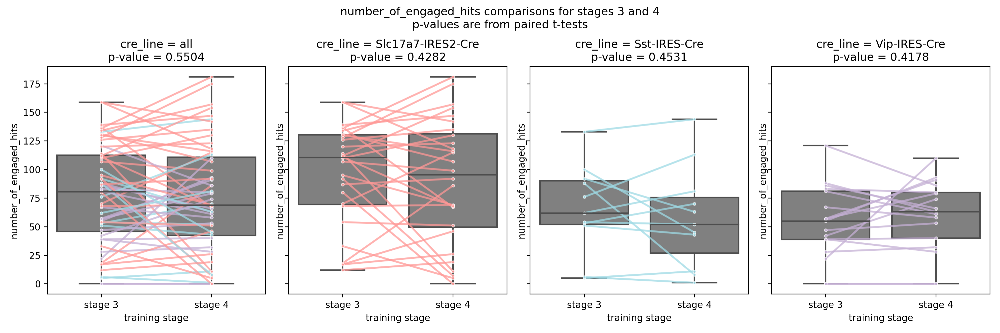

<IPython.core.display.Javascript object>


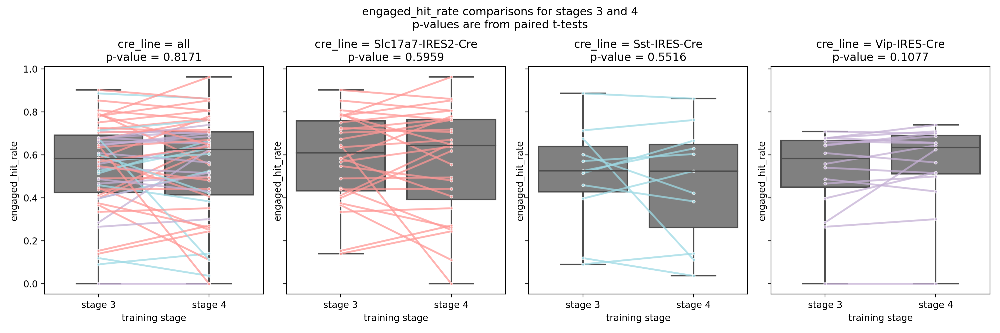

<IPython.core.display.Javascript object>

In [185]:
comparisons = [
    'dprime_trial_corrected',
    'dprime_non_trial_corrected',
    'fraction_engaged',
    'response_latency_mean',
    'response_latency_std',
    'strategy_dropout_index',
    'number_of_engaged_hits',
    'engaged_hit_rate',
    'engaged_fa_rate',
]
for comparison in comparisons:
    comparison_df = get_comparison_df(
        behavior_df, 
        [
            'prior_exposures_to_session_type == 0 and session_number == 3',
            'prior_exposures_to_session_type == 0 and session_number == 4',
        ],
        column_to_compare = comparison,
        suffixes = ['_stage_3', '_stage_4']
    )
    make_comparison_plot(comparison_df, y=comparison, xticklabels=['stage 3', 'stage 4'], xlabel='training stage');

In [187]:
def make_joint_plot(data, x, y):

    j = sns.jointplot(
        data = data,
        x = x,
        y = y,
        kind="reg"
    )
    r, p = stats.pearsonr(
        behavior_df.dropna(subset = [x,y])[x],
        behavior_df.dropna(subset = [x,y])[y],
    )
    phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
    j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])
    j.fig.tight_layout()

<IPython.core.display.Javascript object>


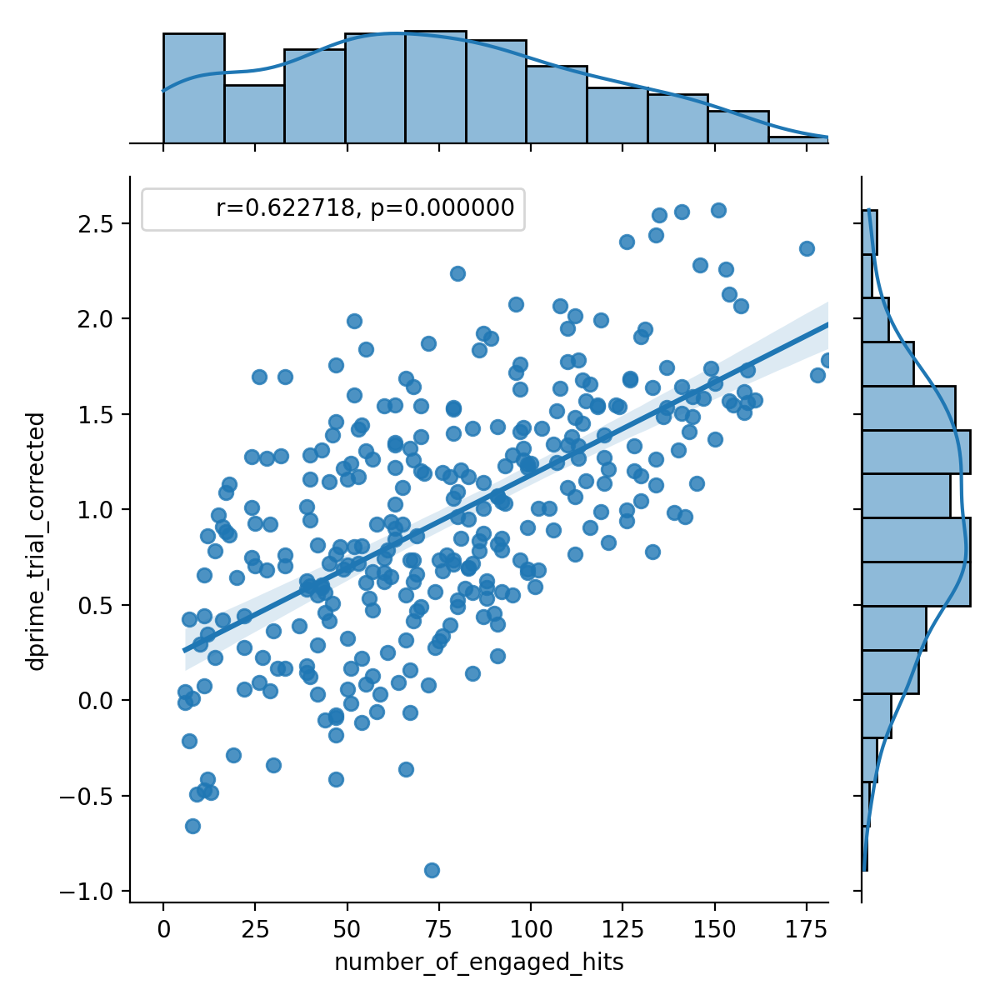

In [188]:
make_joint_plot(
    behavior_df,
    x = 'number_of_engaged_hits',
    y = 'dprime_trial_corrected',
)

## get response latency diff across the stage 3/4 transition

In [ ]:
# response_latency_diff = response_latency_comparisons.pivot(
#         index = 'mouse_id',
#         columns = 'stage',
#         values = 'response_latency_mean'
#     ).reset_index()
# response_latency_diff['response_latency_diff'] = response_latency_diff['stage_4'] - response_latency_diff['stage_3']

# strategy_stage = 3
# cols = ['mouse_id','session_type','behavior_session_id','strategy_dropout_index','visual_strategy_session']
# response_latency_diff_m = response_latency_diff.merge(
#     ophys_summary_table[ophys_summary_table['session_type'].str.startswith('OPHYS_{}'.format(strategy_stage))].query('prior_exposures_to_session_type == 0')[cols],
#     left_on = 'mouse_id',
#     right_on = 'mouse_id',
#     how = 'left'
# )

# response_latency_diff.tail()

## response latency diff by strategy dropout index

In [192]:
def get_latency_diff_and_strategy_index(strategy_stage, metric = 'mean'):
    response_latency_comparisons = get_comparison_df(
        behavior_df, 
        [
            'prior_exposures_to_session_type == 0 and session_number == 3',
            'prior_exposures_to_session_type == 0 and session_number == 4',
        ],
        column_to_compare = 'response_latency_{}'.format(metric),
        suffixes = ['_stage_3', '_stage_4']
    )
    
    response_latency_diff = response_latency_comparisons.pivot(
        index = 'mouse_id',
        columns = 'stage',
        values = 'response_latency_{}'.format(metric)
    ).reset_index().drop_duplicates(subset = ['mouse_id'])
    response_latency_diff.index.rename('index', inplace=True)
    
    response_latency_diff['response_latency_diff'] = response_latency_diff['stage_4'] - response_latency_diff['stage_3']
    cols = ['mouse_id','session_type','behavior_session_id','strategy_dropout_index','visual_strategy_session']
    response_latency_diff = response_latency_diff.merge(
        ophys_summary_table[ophys_summary_table['session_type'].str.startswith('OPHYS_{}'.format(strategy_stage))].query('prior_exposures_to_session_type == 0')[cols],
        left_on = 'mouse_id',
        right_on = 'mouse_id',
        how = 'left'
    )
    return response_latency_diff.sort_values(by = 'mouse_id')

### if we use the strategy from stage 3

<IPython.core.display.Javascript object>


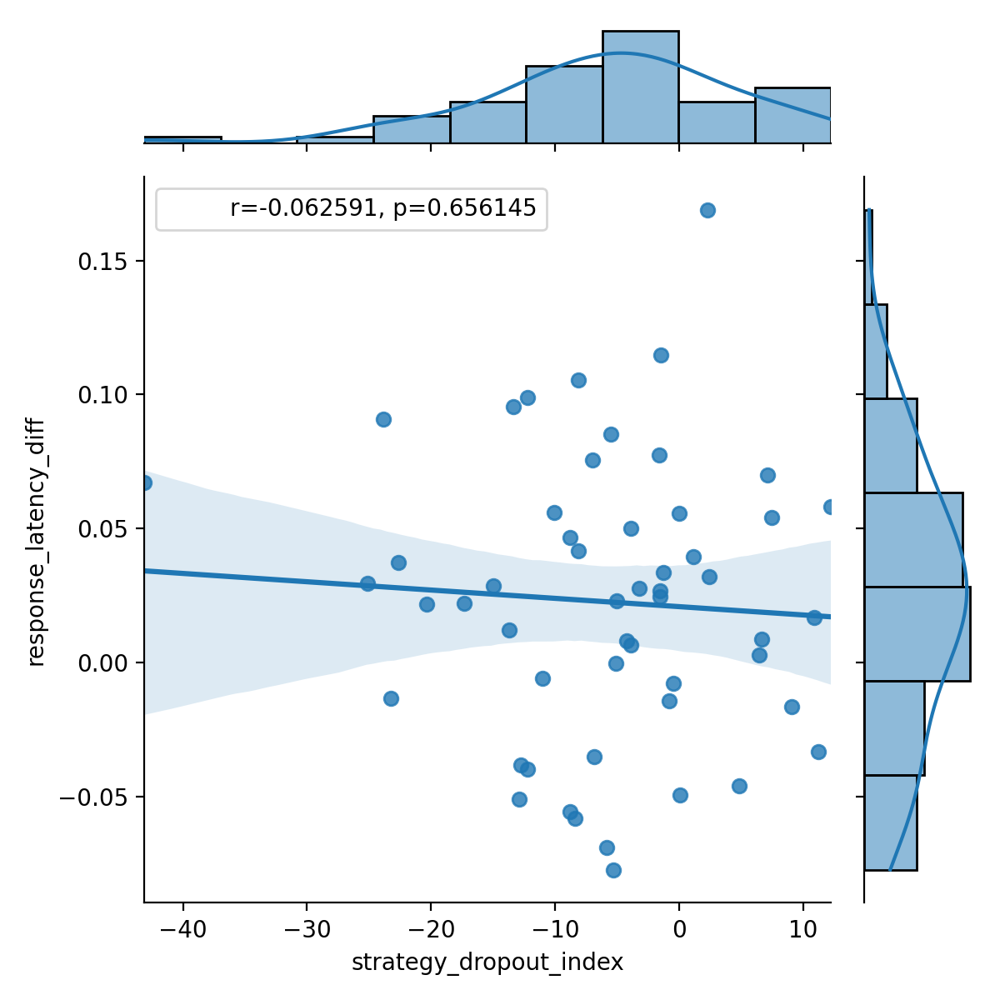

In [193]:
response_latency_diff = get_latency_diff_and_strategy_index(strategy_stage=3)

j = sns.jointplot(
    data = response_latency_diff,
    x = 'strategy_dropout_index',
    y = 'response_latency_diff',
    kind="reg"
)
r, p = stats.pearsonr(
    response_latency_diff['strategy_dropout_index'],
    response_latency_diff['response_latency_diff'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])
j.fig.tight_layout()

<IPython.core.display.Javascript object>


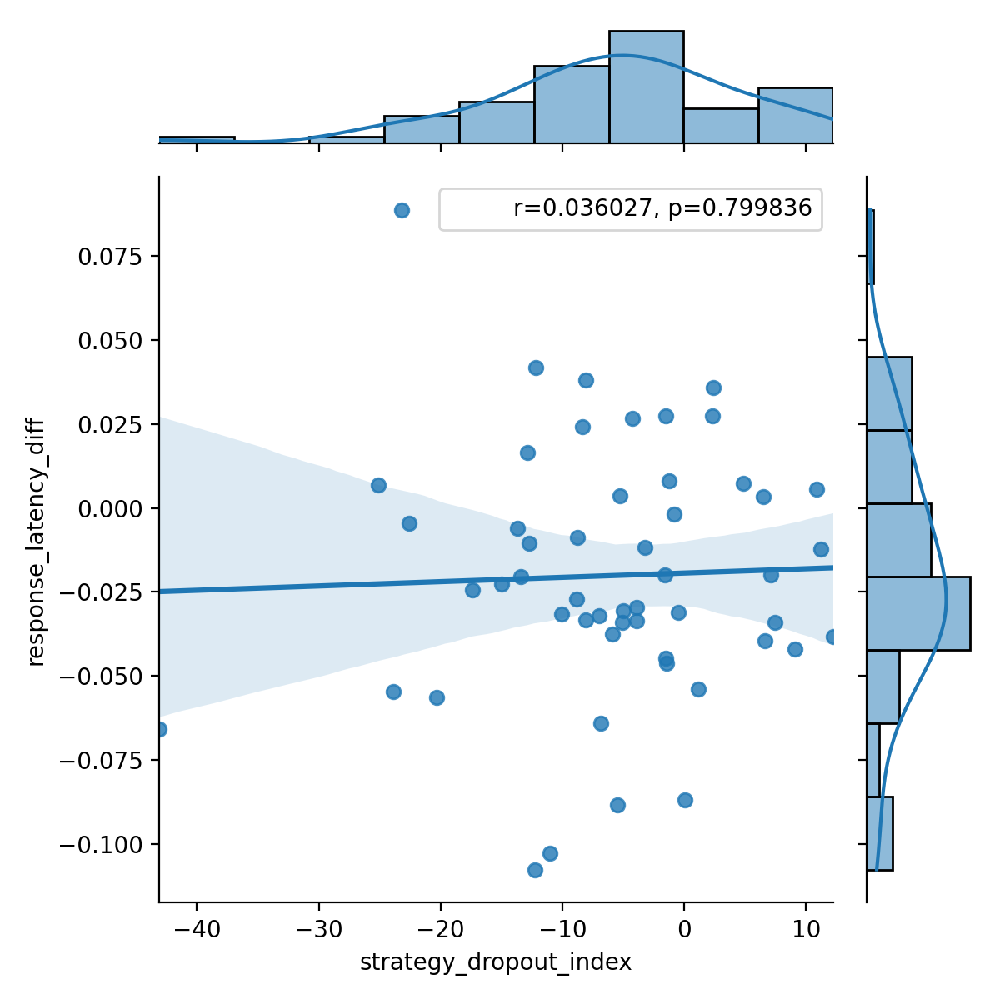

In [194]:
response_latency_diff = get_latency_diff_and_strategy_index(strategy_stage=3, metric = 'std')

j = sns.jointplot(
    data = response_latency_diff,
    x = 'strategy_dropout_index',
    y = 'response_latency_diff',
    kind="reg"
)
r, p = stats.pearsonr(
    response_latency_diff['strategy_dropout_index'],
    response_latency_diff['response_latency_diff'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])
j.fig.tight_layout()

#### if we use the strategy for stage 4:

<IPython.core.display.Javascript object>


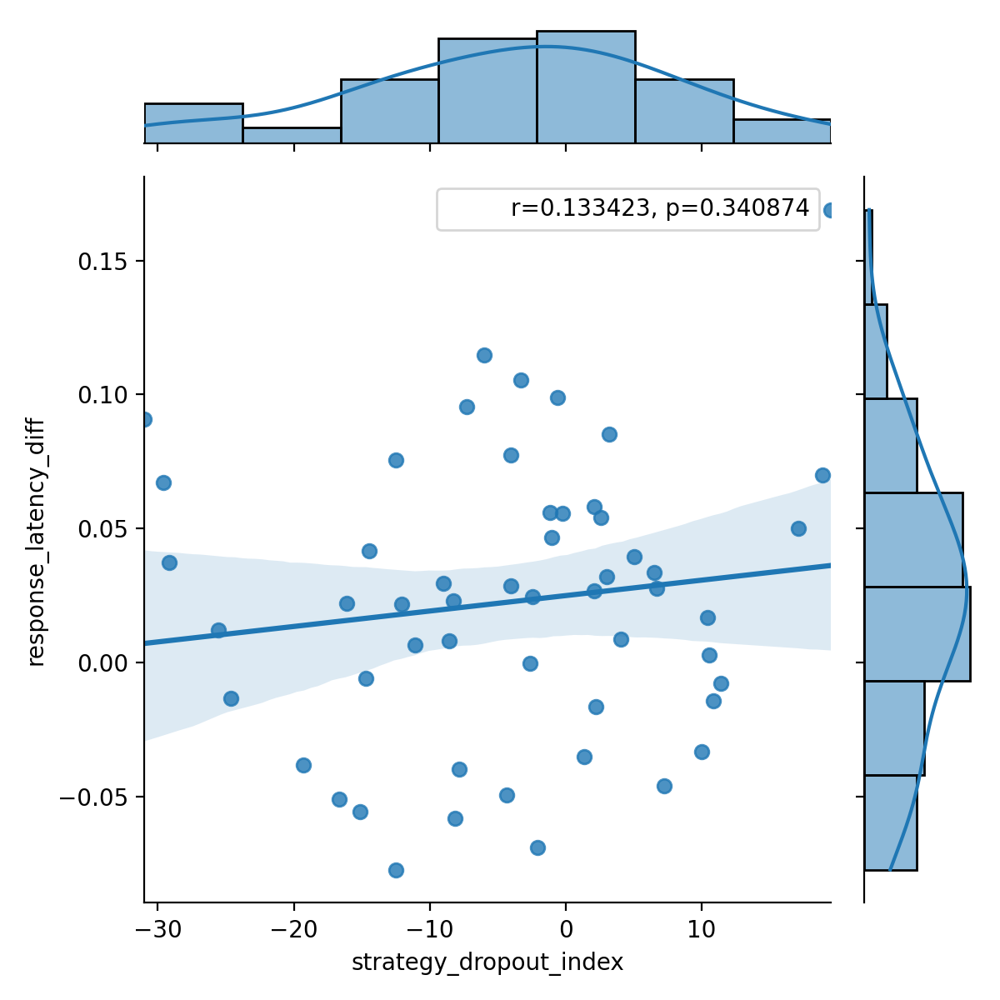

In [195]:
response_latency_diff = get_latency_diff_and_strategy_index(strategy_stage=4, metric = 'mean')

j = sns.jointplot(
    data = response_latency_diff,
    x = 'strategy_dropout_index',
    y = 'response_latency_diff',
    kind="reg"
)
r, p = stats.pearsonr(
    response_latency_diff['strategy_dropout_index'],
    response_latency_diff['response_latency_diff'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])
j.fig.tight_layout()

<IPython.core.display.Javascript object>


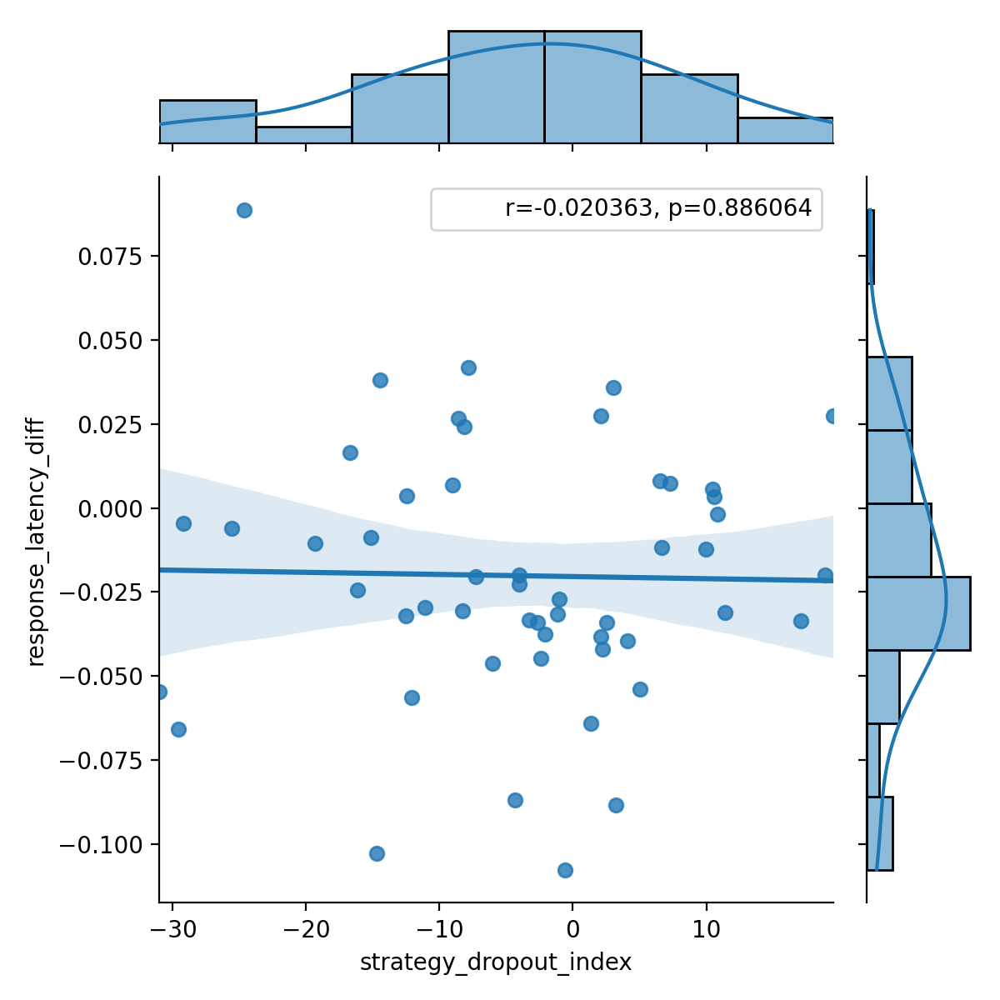

In [196]:
response_latency_diff = get_latency_diff_and_strategy_index(strategy_stage=4, metric = 'std')

j = sns.jointplot(
    data = response_latency_diff,
    x = 'strategy_dropout_index',
    y = 'response_latency_diff',
    kind="reg"
)
r, p = stats.pearsonr(
    response_latency_diff['strategy_dropout_index'],
    response_latency_diff['response_latency_diff'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])
j.fig.tight_layout()

<IPython.core.display.Javascript object>


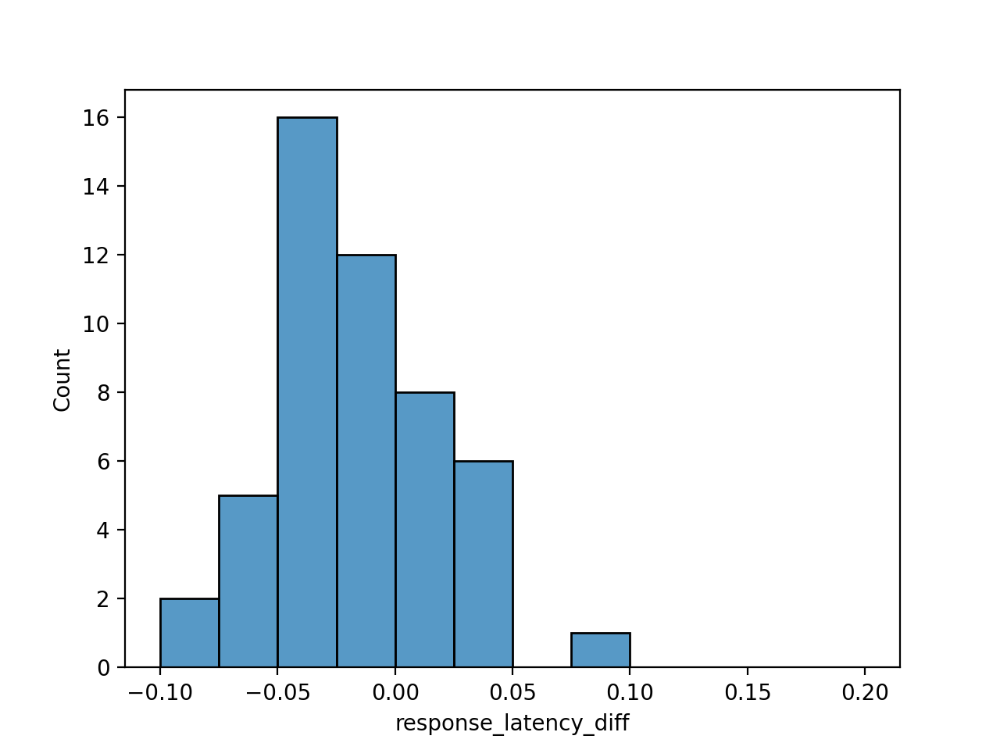

<AxesSubplot:xlabel='response_latency_diff', ylabel='Count'>

In [197]:
fig, ax = plt.subplots()
sns.histplot(
    data = response_latency_diff,
    x = 'response_latency_diff',
    bins = np.arange(-0.1,0.2,0.025)
)

In [198]:
response_latency_diff.head()

,mouse_id,stage_3,stage_4,response_latency_diff,session_type,behavior_session_id,strategy_dropout_index,visual_strategy_session
0,412036,0.149069,0.190722,0.041653,OPHYS_4_images_B,795742990,-7.856212,False
1,412366,0.205025,0.139356,-0.065669,OPHYS_4_images_B,794673280,-29.573796,False
2,425493,0.110009,0.078840,-0.031170,OPHYS_4_images_B,808324301,11.421397,True
3,425496,0.079332,0.106694,0.027362,OPHYS_4_images_B,808432167,2.097468,True
4,431252,0.144754,0.111425,-0.033329,OPHYS_4_images_B,833946929,-3.271368,False


In [201]:
behavior_df_merged = behavior_df.merge(
    ophys_summary_table[['behavior_session_id','strategy_dropout_index','visual_strategy_session']],
    left_on = 'behavior_session_id',
    right_on = 'behavior_session_id',
)

In [202]:
behavior_df.sample(5)

,ophys_experiment_id,response_latency_count,response_latency_mean,response_latency_std,response_latency_min,response_latency_25%,response_latency_50%,response_latency_75%,response_latency_max,hit_rate,fa_rate,number_of_engaged_go_trials,number_of_engaged_hits,number_of_engaged_catch_trials,number_of_engaged_false_alarms,fraction_engaged,dprime_trial_corrected,dprime_non_trial_corrected,engaged_hit_rate,engaged_fa_rate,equipment_name,donor_id,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,foraging_id,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,behavior_session_id,ophys_container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,isi_experiment_id,imaging_depth,targeted_structure,published_at,date_of_acquisition,session_type,session_tags,failure_tags,model_outputs_available,location
49,965224600,72.0,0.585719,0.111123,0.028789,0.579199,0.595914,0.633476,0.712689,0.631579,0.062500,114.0,72.0,16.0,1.0,0.389222,1.870159,1.870159,0.631579,0.062500,CAM2P.4,880255009,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,467953,Ai148(TIT2L-GC6f-ICL-tTA2),['Vip-IRES-Cre'],M,177.0,78a55859-1513-49b3-980e-c0732621967b,Vip-IRES-Cre,GCaMP6f,1,0,47.0,0.0,964887530,964999392,957570596,VisualBehaviorTask1B,published,passed,20191010_467953_1imagesB,888943558,175,VISp,2021-03-25 00:00:00.000000,2019-10-10 17:30:16.000000,OPHYS_1_images_B,NaN,NaN,True,Vip_VISp_175
341,1051216600,78.0,0.548654,0.095417,0.029212,0.529492,0.546317,0.592172,0.713112,0.553191,0.150000,141.0,78.0,20.0,3.0,0.473529,1.170162,1.170162,0.553191,0.150000,CAM2P.4,1033189349,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,533162,Ai93(TITL-GCaMP6f),"['Slc17a7-IRES2-Cre', 'Camk2a-tTA']",M,125.0,63f32fdc-6f2f-493a-8ab6-017b3daae504,Slc17a7-IRES2-Cre,GCaMP6f,4,2,5.0,8.0,1051120218,1051138449,1046279796,VisualBehaviorTask1B,published,passed,533162_20200917_4imagesAretake,1037689249,175,VISp,2021-03-25 00:00:00.000000,2020-09-17 16:44:28.000000,OPHYS_4_images_A,NaN,NaN,True,Slc17a7_VISp_175
262,836258936,68.0,0.545760,0.139081,0.012255,0.512652,0.562715,0.629422,0.729305,0.618182,0.375000,110.0,68.0,16.0,6.0,0.430034,0.619348,0.619348,0.618182,0.375000,CAM2P.4,784057617,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,431252,Ai93(TITL-GCaMP6f),"['Slc17a7-IRES2-Cre', 'Camk2a-tTA']",F,145.0,c2408e39-4022-4f70-bde6-886702a08e01,Slc17a7-IRES2-Cre,GCaMP6f,6,0,3.0,7.0,835796136,835940015,829561794,VisualBehavior,published,passed,20190312_431252_6imagesB,792314934,375,VISp,2021-03-25 00:00:00.000000,2019-03-12 14:26:27.000000,OPHYS_6_images_B,NaN,NaN,True,Slc17a7_VISp_375
247,848694639,137.0,0.407286,0.126720,0.078556,0.312076,0.362096,0.495576,0.729146,0.685000,0.103448,200.0,137.0,29.0,3.0,0.901575,1.743872,1.743872,0.685000,0.103448,CAM2P.3,813703535,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,440298,Ai93(TITL-GCaMP6f),"['Slc17a7-IRES2-Cre', 'Camk2a-tTA']",M,114.0,50690a6e-b9a3-4fce-9c73-df1d214a7f75,Slc17a7-IRES2-Cre,GCaMP6f,4,0,0.0,4.0,845219209,845441512,843049827,VisualBehavior,published,passed,20190403_440298_4imagesB,822459611,375,VISp,2021-03-25 00:00:00.000000,2019-04-03 15:55:13.000000,OPHYS_4_images_B,NaN,NaN,True,Slc17a7_VISp_375
208,817267785,63.0,0.471131,0.077076,0.329178,0.412598,0.462678,0.512708,0.729528,0.724138,0.266667,87.0,63.0,15.0,4.0,0.323810,1.218104,1.218104,0.724138,0.266667,CAM2P.5,789992895,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,431023,Ai93(TITL-GCaMP6f),"['Slc17a7-IRES2-Cre', 'Camk2a-tTA']",M,99.0,df058b40-27f4-4a24-be6e-5026ac8e697d,Slc17a7-IRES2-Cre,GCaMP6f,4,0,0.0,5.0,817101568,817165094,812858755,VisualBehavior,published,passed,20190201_431023_4imagesB,796874559,175,VISp,2021-03-25 00:00:00.000000,2019-02-01 20:11:18.000000,OPHYS_4_images_B,NaN,NaN,True,Slc17a7_VISp_175


<IPython.core.display.Javascript object>


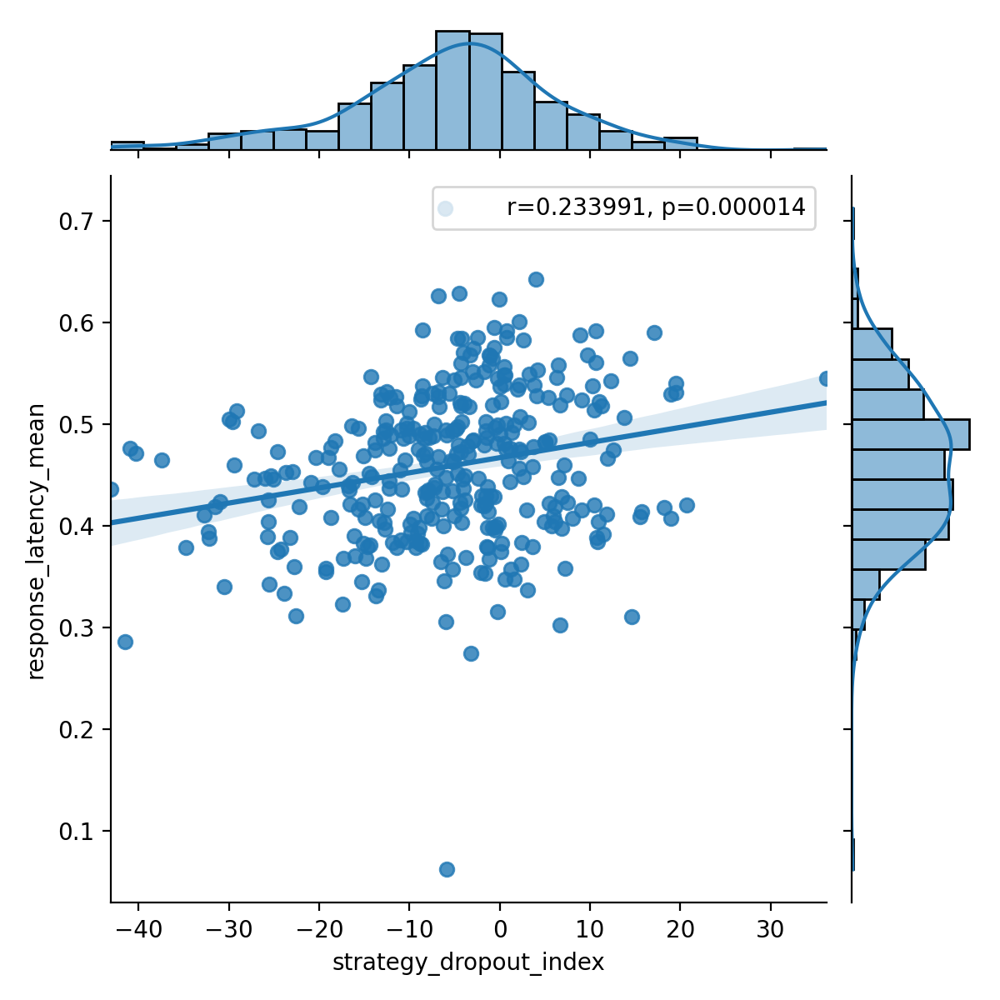

In [203]:
j = sns.jointplot(
    data = behavior_df_merged,
    x = 'strategy_dropout_index',
    y = 'response_latency_mean',
    kind="reg"
)
r, p = stats.pearsonr(
    behavior_df_merged.dropna(subset = ['response_latency_mean', 'strategy_dropout_index'])['response_latency_mean'],
    behavior_df_merged.dropna(subset = ['response_latency_mean', 'strategy_dropout_index'])['strategy_dropout_index'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

<IPython.core.display.Javascript object>


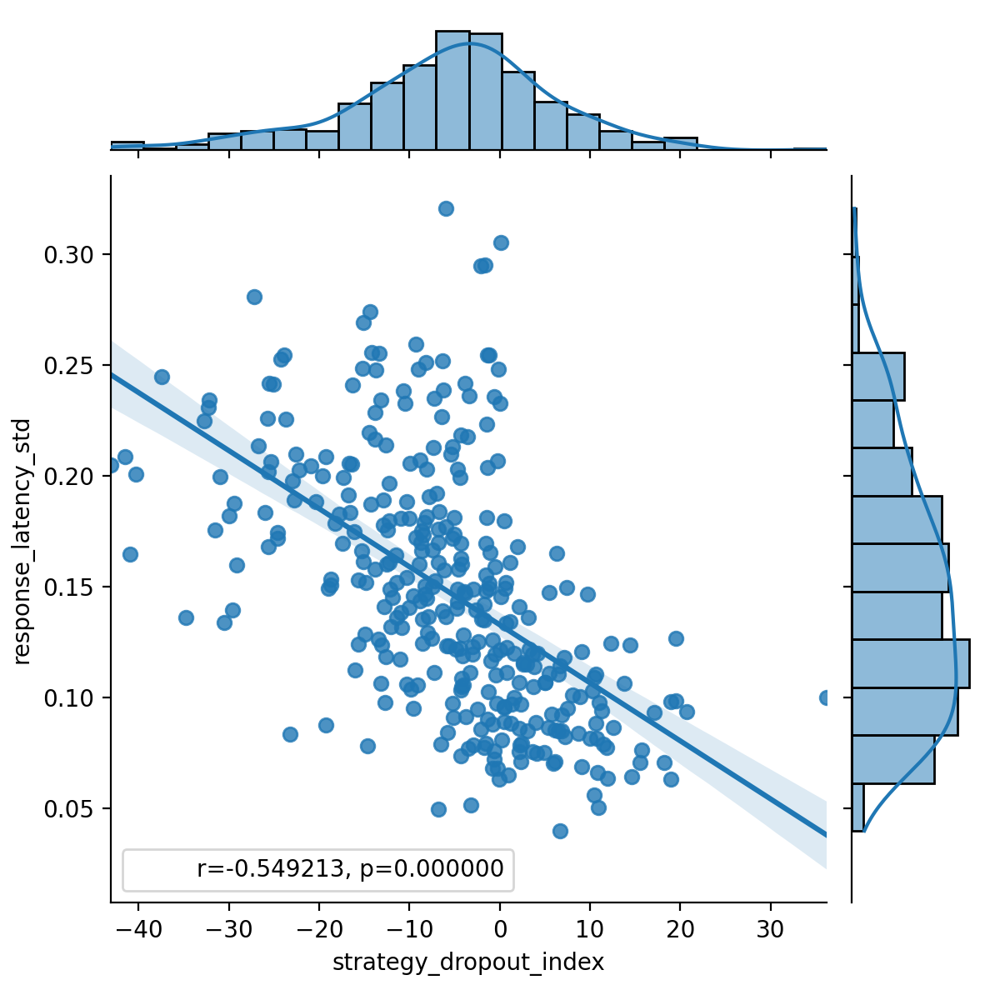

In [204]:
j = sns.jointplot(
    data = behavior_df_merged,
    x = 'strategy_dropout_index',
    y = 'response_latency_std',
    kind="reg"
)
r, p = stats.pearsonr(
    behavior_df_merged.dropna(subset = ['response_latency_std', 'strategy_dropout_index'])['response_latency_std'],
    behavior_df_merged.dropna(subset = ['response_latency_std', 'strategy_dropout_index'])['strategy_dropout_index'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

In [205]:
def do_regression(input_df, metric):
    j = sns.jointplot(
        data = input_df,
        x = 'strategy_dropout_index',
        y = 'response_latency_{}'.format(metric),
        kind="reg"
    )
    r, p = stats.pearsonr(
        input_df.dropna(subset = ['response_latency_{}'.format(metric), 'strategy_dropout_index'])['response_latency_{}'.format(metric)],
        input_df.dropna(subset = ['response_latency_{}'.format(metric), 'strategy_dropout_index'])['strategy_dropout_index'],
    )
    phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
    j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])
    
    return j

<IPython.core.display.Javascript object>


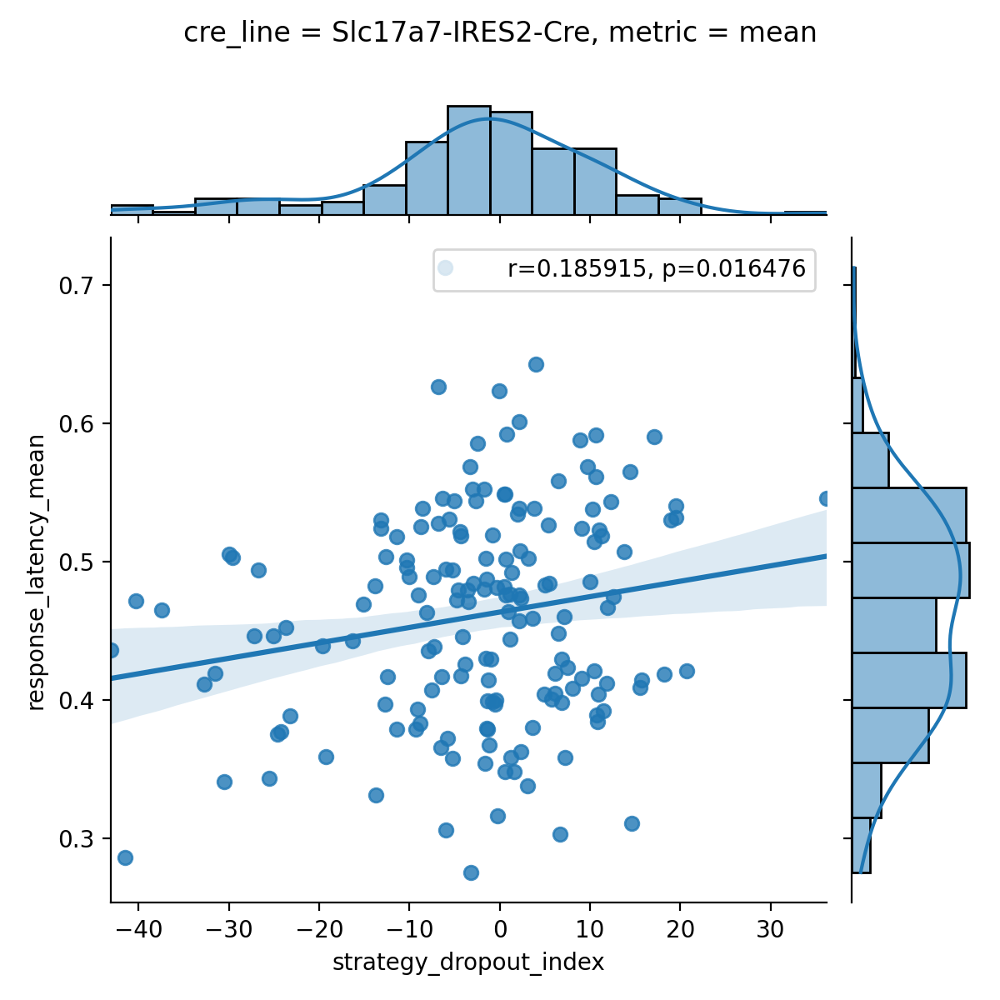

<IPython.core.display.Javascript object>


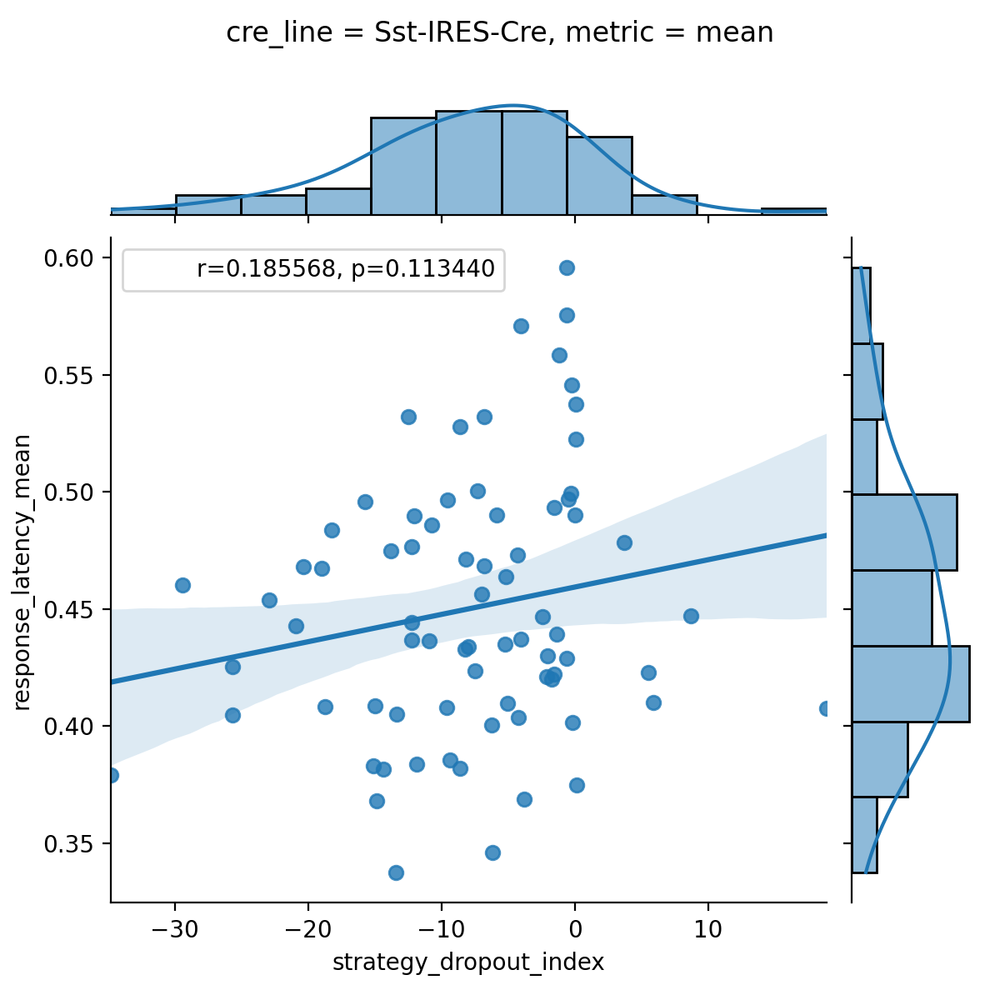

<IPython.core.display.Javascript object>


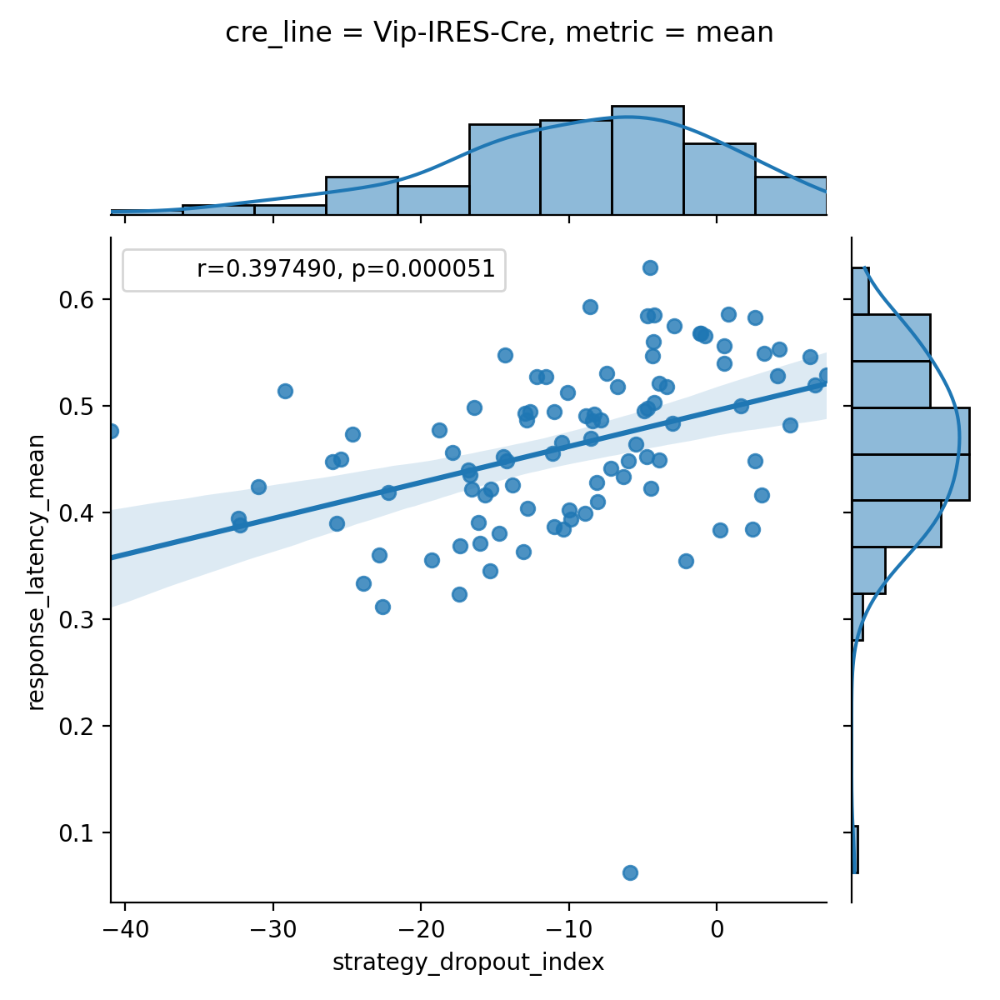

<IPython.core.display.Javascript object>


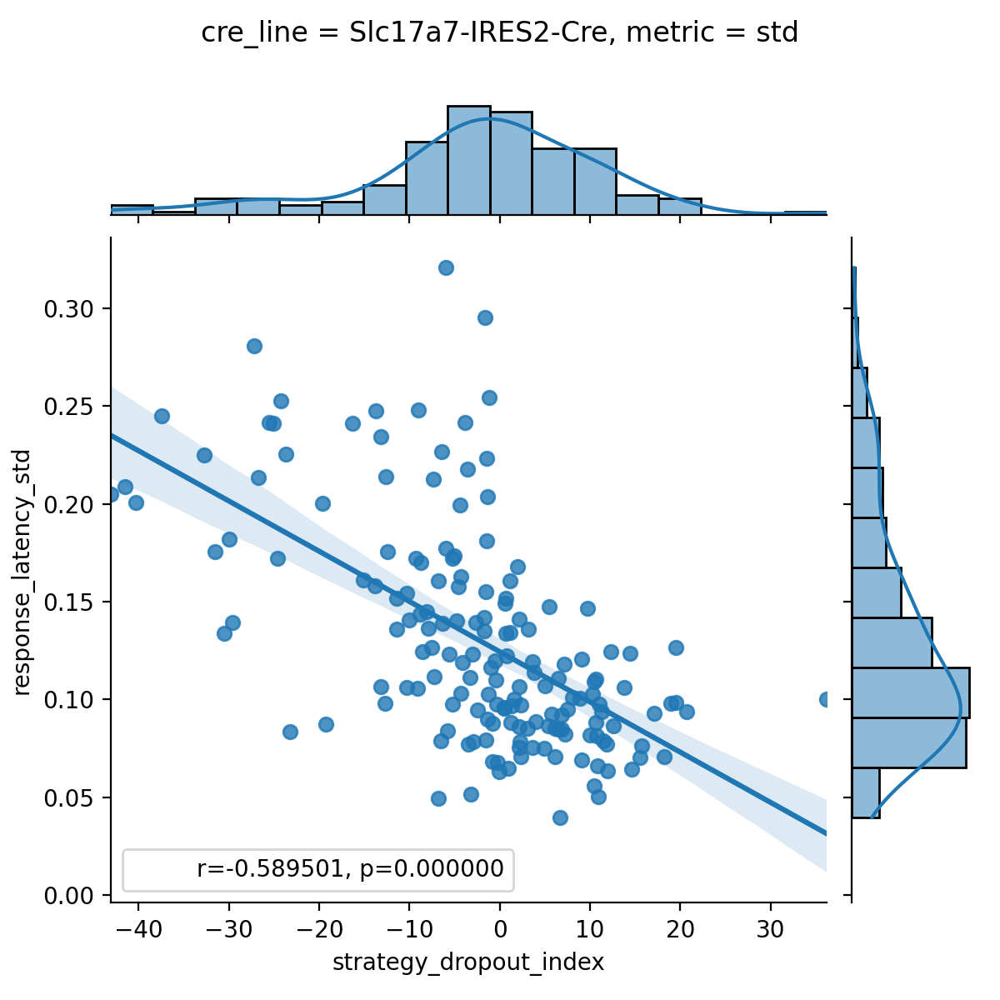

<IPython.core.display.Javascript object>


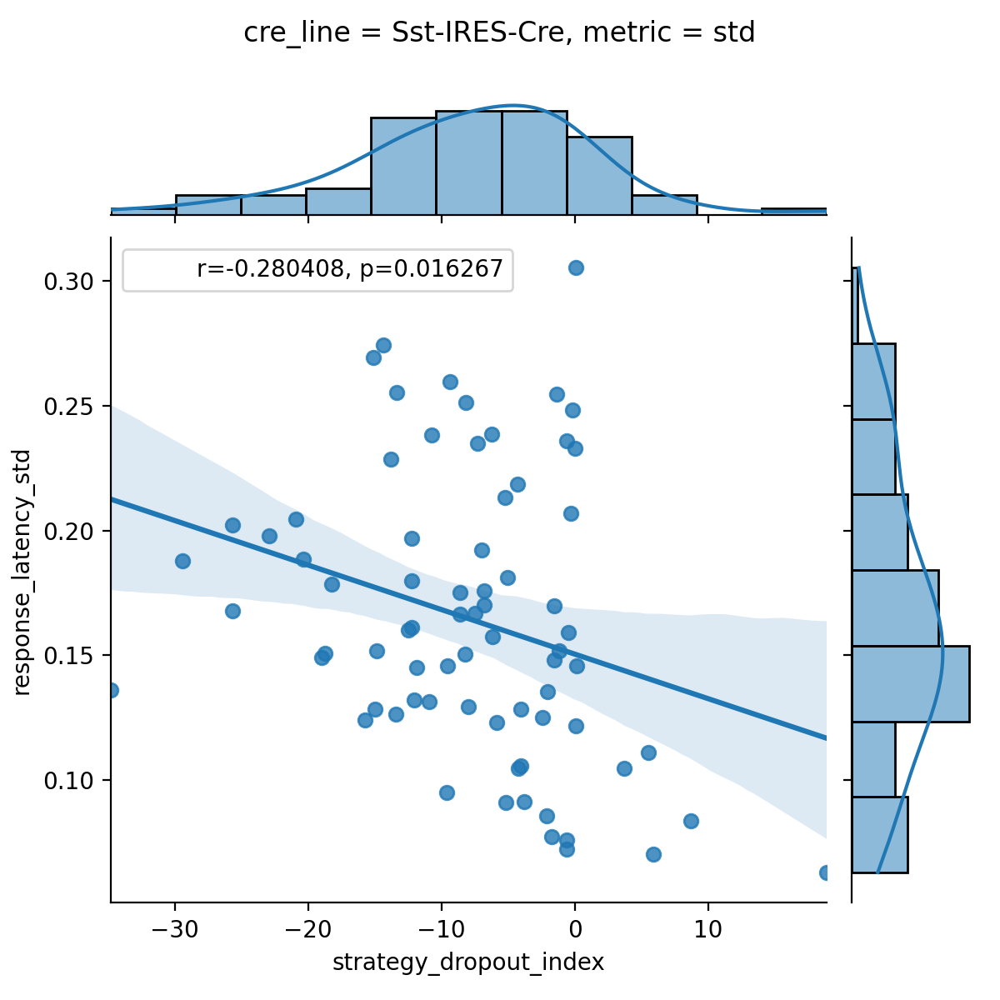

<IPython.core.display.Javascript object>


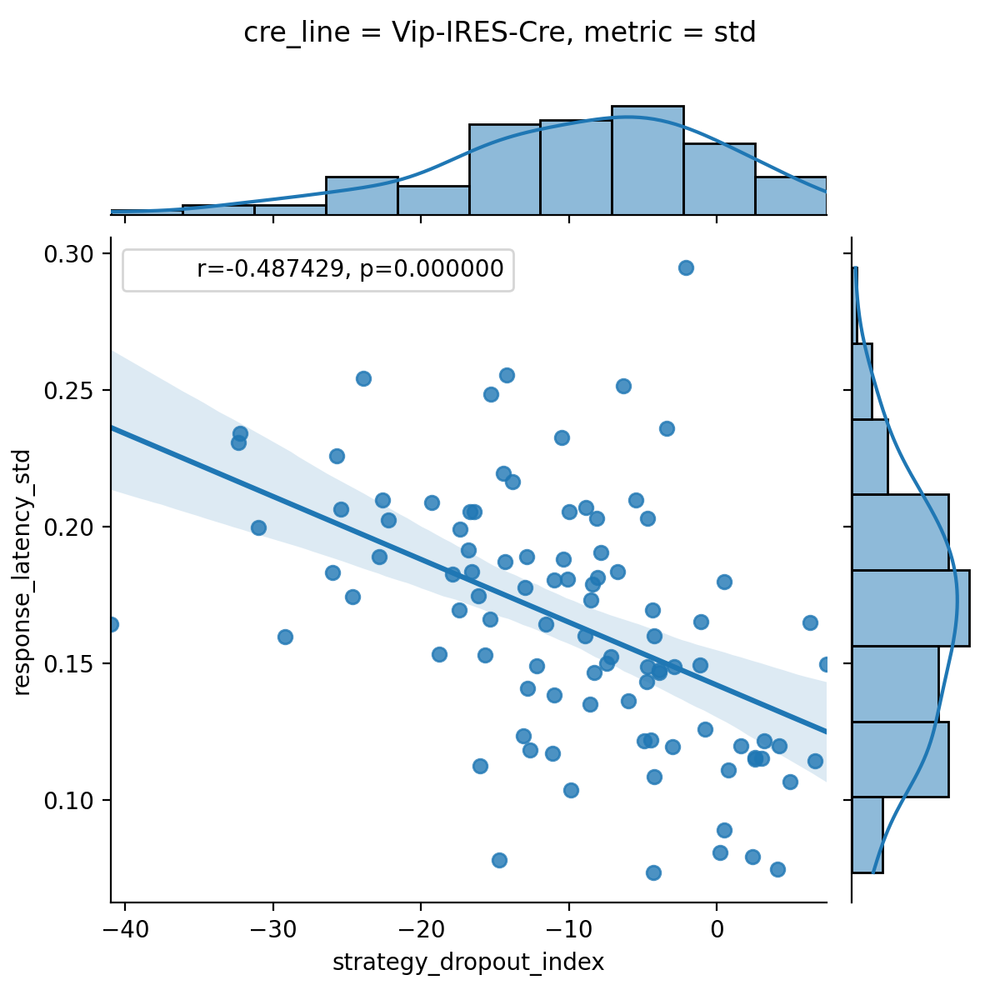

In [206]:
for metric in ['mean','std']:
    for cre_line in np.sort(behavior_df_merged['cre_line'].unique()):
        j = do_regression(behavior_df_merged.query('cre_line == @cre_line'), metric=metric)
        plt.subplots_adjust(top = 0.9)
        j.fig.suptitle('cre_line = {}, metric = {}'.format(cre_line, metric))

In [207]:
behavior_df_merged

,ophys_experiment_id,response_latency_count,response_latency_mean,response_latency_std,response_latency_min,response_latency_25%,response_latency_50%,response_latency_75%,response_latency_max,hit_rate,fa_rate,number_of_engaged_go_trials,number_of_engaged_hits,number_of_engaged_catch_trials,number_of_engaged_false_alarms,fraction_engaged,dprime_trial_corrected,dprime_non_trial_corrected,engaged_hit_rate,engaged_fa_rate,equipment_name,donor_id,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,foraging_id,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,behavior_session_id,ophys_container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,isi_experiment_id,imaging_depth,targeted_structure,published_at,date_of_acquisition,session_type,session_tags,failure_tags,model_outputs_available,location,strategy_dropout_index,visual_strategy_session
0,958527471,53.0,0.422242,0.169722,-0.035992,0.364268,0.464408,0.514468,0.714638,0.514563,0.083333,103.0,53.0,12.0,1.0,0.372168,1.419507,1.419507,0.514563,0.083333,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,210.0,0210d6f7-93f7-4bc1-a622-5c22b1daa11c,Sst-IRES-Cre,GCaMP6f,3,0,67.0,2.0,954954402,953982960,1018028345,VisualBehaviorMultiscope,published,passed,20190924_457841_3imagesA,858992726,225,VISp,2021-03-25 00:00:00.000000,2019-09-24 16:00:00.000000,OPHYS_3_images_A,NaN,NaN,True,Sst_VISp_225,-1.532232,False
1,957759576,70.0,0.446784,0.125046,0.030732,0.397652,0.439382,0.514462,0.714622,0.666667,0.133333,105.0,70.0,15.0,2.0,0.418118,1.541499,1.541499,0.666667,0.133333,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,213.0,40897cd4-3279-4a2d-b65d-b3f984e34e17,Sst-IRES-Cre,GCaMP6f,4,0,0.0,4.0,957020350,957032492,1018028360,VisualBehaviorMultiscope,published,passed,20190927_457841_4imagesB,858992726,300,VISl,2021-03-25 00:00:00.000000,2019-09-27 08:28:05.415005,OPHYS_4_images_B,NaN,NaN,True,Sst_VISl_300,-2.419074,False
2,956941841,56.0,0.436431,0.131464,-0.019297,0.393495,0.464443,0.514485,0.697993,0.444444,0.250000,126.0,56.0,16.0,4.0,0.535849,0.534779,0.534779,0.444444,0.250000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,212.0,2a4ef1a6-4c8a-4d37-bfca-b7d4a166daf2,Sst-IRES-Cre,GCaMP6f,3,1,68.0,3.0,955775716,956010809,1018028342,VisualBehaviorMultiscope,published,passed,20190926_457841_3imagesA,858992726,150,VISp,2021-03-25 00:00:00.000000,2019-09-26 08:44:37.199778,OPHYS_3_images_A,NaN,"parent_averaged_depth_image_6,parent_averaged_...",True,Sst_VISp_150,-10.917787,False
3,960410026,77.0,0.345930,0.157424,-0.035981,0.314299,0.381009,0.447709,0.614539,0.693694,0.400000,111.0,77.0,15.0,6.0,0.642857,0.759695,0.759695,0.693694,0.400000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,218.0,4bda6fef-467c-47cc-b713-ec012b2eb90e,Sst-IRES-Cre,GCaMP6f,6,0,2.0,7.0,959458018,959681045,1018028345,VisualBehaviorMultiscope,published,passed,20191002_457841_6imagesB,858992726,225,VISp,2021-03-25 00:00:00.000000,2019-10-02 08:52:18.346563,OPHYS_6_images_B,NaN,z_drift_corr_um_diff,True,Sst_VISp_225,-6.153439,False
4,951980475,65.0,0.367917,0.151765,-0.053195,0.313755,0.397115,0.463885,0.697415,0.532787,0.200000,122.0,65.0,20.0,4.0,0.679426,0.923899,0.923899,0.532787,0.200000,MESO.1,850862423,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),['Sst-IRES-Cre'],F,206.0,592420fb-911d-41c5-8763-4ebdeb0ef416,Sst-IRES-Cre,GCaMP6f,1,0,65.0,0.0,951410079,951520319,1018028339,VisualBehaviorMultiscope,published,passed,20190920_457841_1imagesA_2,848974280,75,VISp,2021-03-25 00:00:00.000000,2019-09-20 09:45:29.897856,OPHYS_1_images_A,NaN,NaN,True,Sst_VISp_75,-14.860225,False
5,958741219,40.0,0

<IPython.core.display.Javascript object>


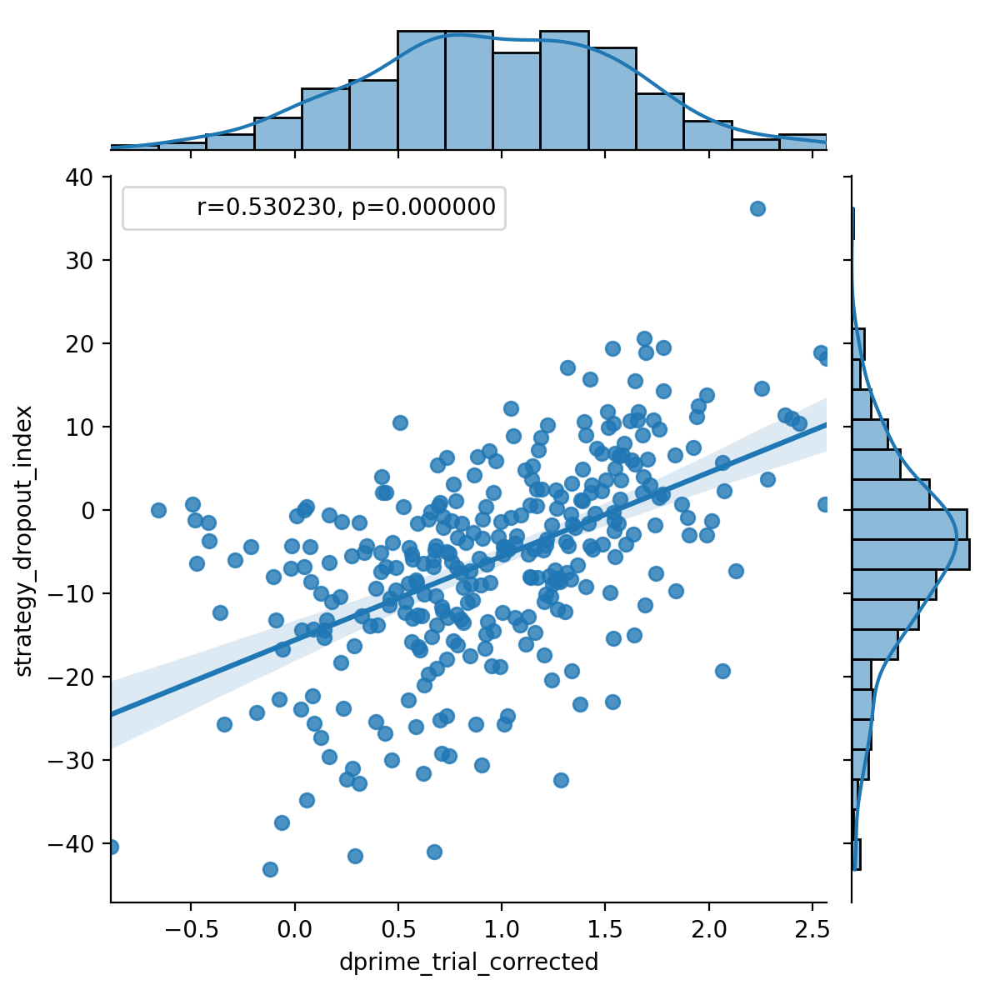

In [212]:
j = sns.jointplot(
    data = behavior_df_merged,
    x = 'dprime_trial_corrected',
    y = 'strategy_dropout_index',
    kind="reg"
)
r, p = stats.pearsonr(
    behavior_df_merged.dropna(subset = ['strategy_dropout_index', 'dprime_trial_corrected'])['dprime_trial_corrected'],
    behavior_df_merged.dropna(subset = ['strategy_dropout_index', 'dprime_trial_corrected'])['strategy_dropout_index'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

<IPython.core.display.Javascript object>


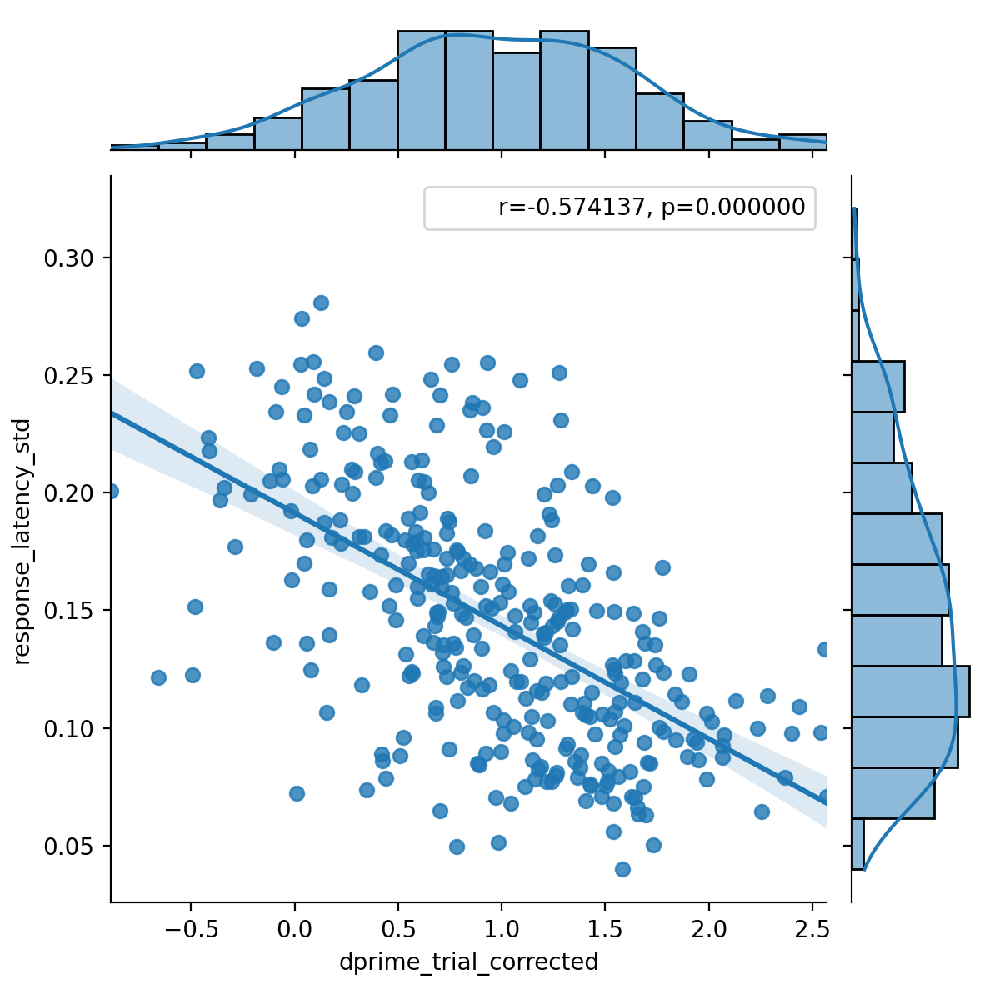

In [214]:
j = sns.jointplot(
    data = behavior_df_merged,
    x = 'dprime_trial_corrected',
    y = 'response_latency_std',
    kind="reg"
)
r, p = stats.pearsonr(
    behavior_df_merged.dropna(subset = ['response_latency_std', 'dprime_trial_corrected'])['dprime_trial_corrected'],
    behavior_df_merged.dropna(subset = ['response_latency_std', 'dprime_trial_corrected'])['response_latency_std'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

<IPython.core.display.Javascript object>


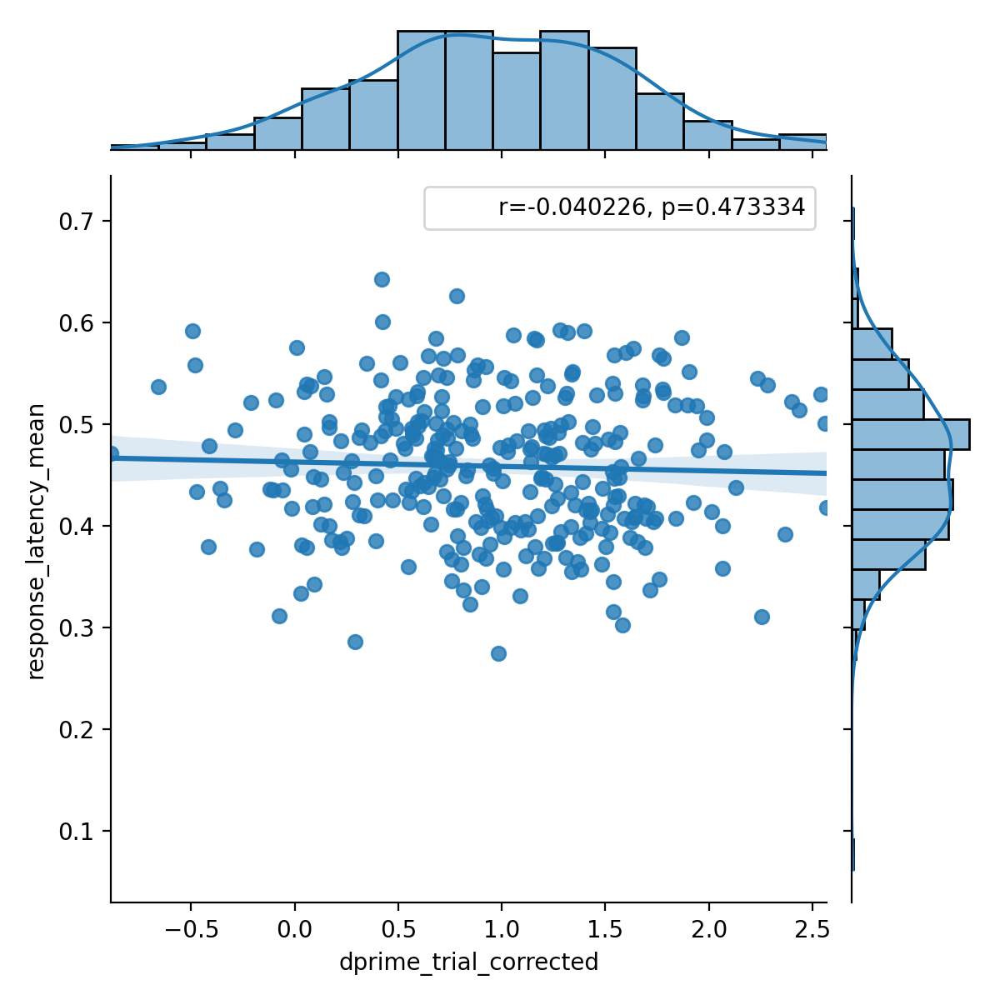

In [216]:
j = sns.jointplot(
    data = behavior_df_merged,
    x = 'dprime_trial_corrected',
    y = 'response_latency_mean',
    kind="reg"
)
r, p = stats.pearsonr(
    behavior_df_merged.dropna(subset = ['response_latency_mean', 'dprime_trial_corrected'])['dprime_trial_corrected'],
    behavior_df_merged.dropna(subset = ['response_latency_mean', 'dprime_trial_corrected'])['response_latency_mean'],
)
phantom, = j.ax_joint.plot([], [], linestyle="", alpha=0)
j.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

## repeat for d'

<IPython.core.display.Javascript object>


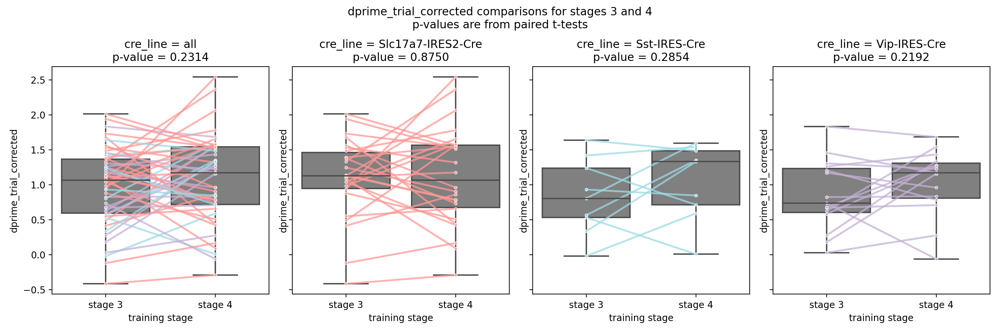

In [220]:
d_prime_comparisons = get_comparison_df(
    behavior_df, 
    [
        'prior_exposures_to_session_type == 0 and session_number == 3',
        'prior_exposures_to_session_type == 0 and session_number == 4',
    ],
    column_to_compare = 'dprime_trial_corrected',
    suffixes = ['_stage_3', '_stage_4']
)
make_comparison_plot(d_prime_comparisons, y='dprime_trial_corrected', xticklabels=['stage 3', 'stage 4'], xlabel='training stage');

## get reaction time by epoch
This takes some time!

In [221]:
def reaction_time_by_epoch(ophys_experiment_id, epoch):
    try:
        session = loading.get_ophys_dataset(ophys_experiment_id)
        
        first_start_time = session.trials['start_time'].iloc[0]
        trials = session.trials.query('start_time >= @first_start_time + @epoch*60 and start_time < @first_start_time + (@epoch + 10)*60')

        output_dict = {
            'ophys_experiment_id': ophys_experiment_id,
            'epoch': epoch,
        }
        output_dict.update({'response_latency_{}'.format(key):value for key,value in trials.query('hit')['response_latency'].describe().to_dict().items()})

        return output_dict
    except Exception as e:
        print('failed on {}'.format(ophys_experiment_id))
        print(e)
        return {'ophys_experiment_id': ophys_experiment_id}

In [222]:
ophys_experiment_id = 956941846

session = loading.get_ophys_dataset(ophys_experiment_id)

output_dict = {'ophys_experiment_id': ophys_experiment_id}
output_dict.update({'response_latency_{}'.format(key):value for key,value in session.trials.query('hit')['response_latency'].describe().to_dict().items()})

In [223]:
reaction_time_by_epoch(ophys_experiment_id, 0)

{'ophys_experiment_id': 956941846,
 'epoch': 0,
 'response_latency_count': 7.0,
 'response_latency_mean': 0.22137717869832482,
 'response_latency_std': 0.1756954699527222,
 'response_latency_min': -0.035967107015949296,
 'response_latency_25%': 0.12246789298404792,
 'response_latency_50%': 0.28096289298400734,
 'response_latency_75%': 0.3310078929840188,
 'response_latency_max': 0.3976928929840824}

In [224]:
epochs = [0,10,20,30,40,50]
with Pool(32) as pool:
    reaction_time_by_epoch_df = pd.DataFrame(pool.starmap(reaction_time_by_epoch, itertools.product(sessions['ophys_experiment_id'].to_list(), epochs)))

In [225]:
rdf = reaction_time_by_epoch_df.merge(
    sessions,
    left_on = 'ophys_experiment_id',
    right_on = 'ophys_experiment_id'
)

rdf = rdf.merge(
    ophys_summary_table[['behavior_session_id','strategy_dropout_index','visual_strategy_session']],
    left_on = 'behavior_session_id',
    right_on = 'behavior_session_id',
)

<IPython.core.display.Javascript object>


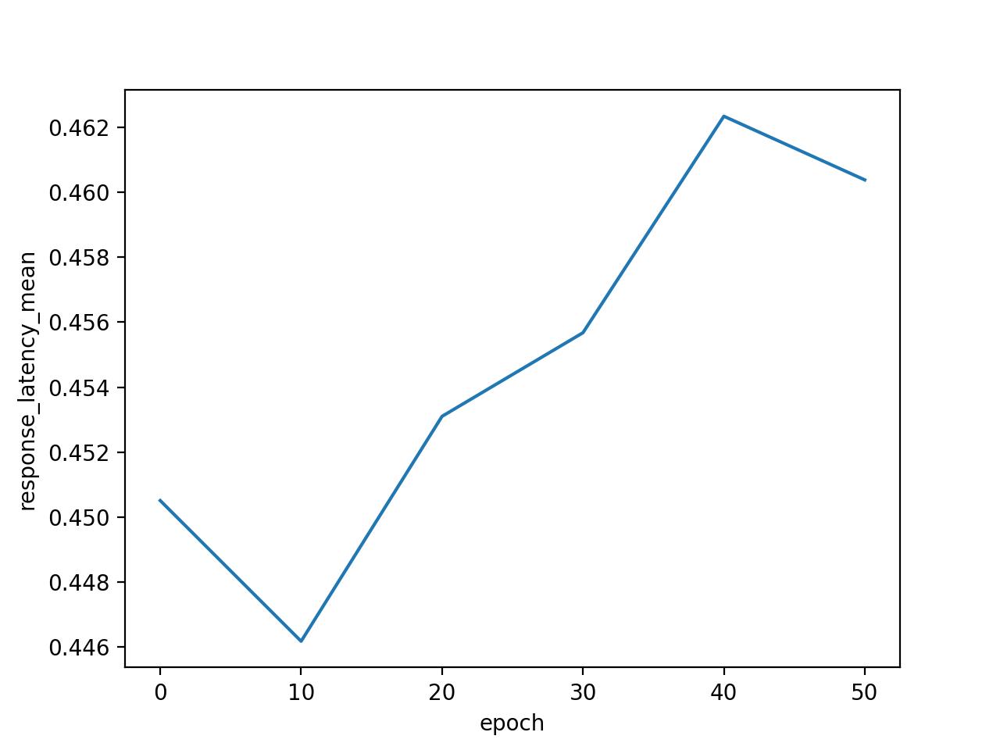

<AxesSubplot:xlabel='epoch', ylabel='response_latency_mean'>

In [226]:
fig,ax = plt.subplots()
sns.lineplot(
    data=rdf,
    x = 'epoch',
    y = 'response_latency_mean',
)

<IPython.core.display.Javascript object>


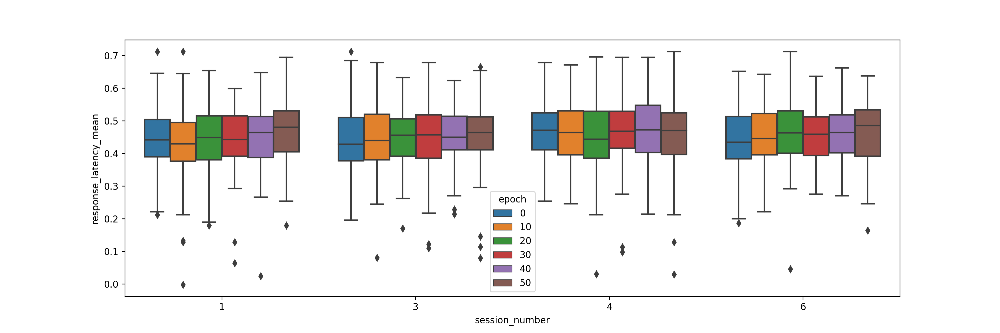

<AxesSubplot:xlabel='session_number', ylabel='response_latency_mean'>

In [227]:
fig,ax = plt.subplots(figsize = (15,5))
sns.boxplot(
    data=rdf,
    x = 'session_number',
    y = 'response_latency_mean',
    hue = 'epoch',
    ax=ax,
)

<IPython.core.display.Javascript object>


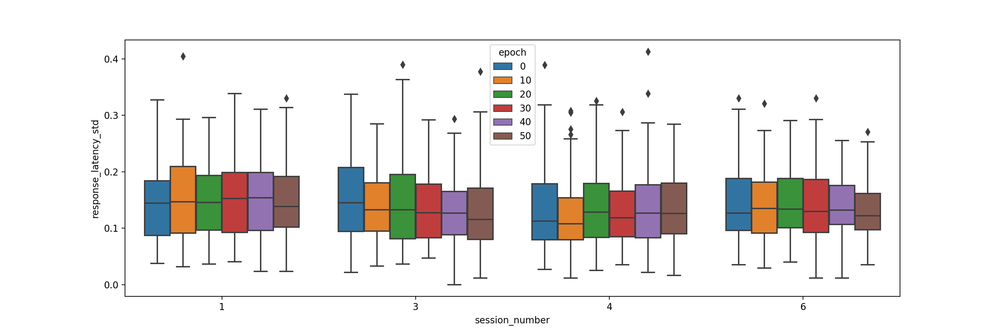

<AxesSubplot:xlabel='session_number', ylabel='response_latency_std'>

In [228]:
fig,ax = plt.subplots(figsize = (15,5))
sns.boxplot(
    data=rdf,
    x = 'session_number',
    y = 'response_latency_std',
    hue = 'epoch',
    ax=ax,
)

<IPython.core.display.Javascript object>


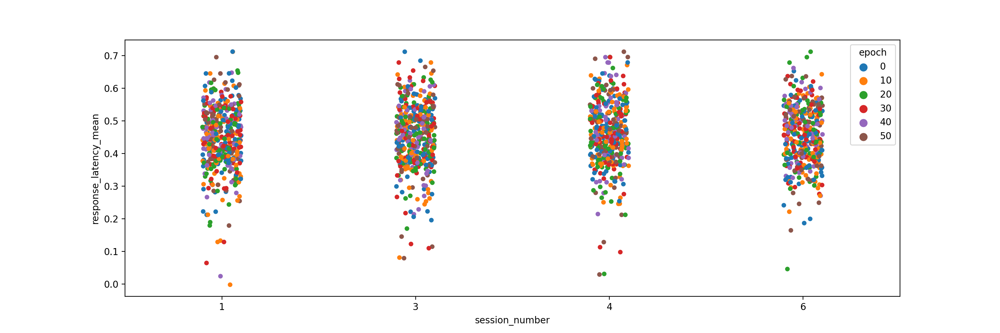

<AxesSubplot:xlabel='session_number', ylabel='response_latency_mean'>

In [229]:
fig,ax = plt.subplots(figsize = (15,5))
sns.stripplot(
    data=rdf,
    x = 'session_number',
    y = 'response_latency_mean',
    hue = 'epoch',
    ax = ax
)

<IPython.core.display.Javascript object>


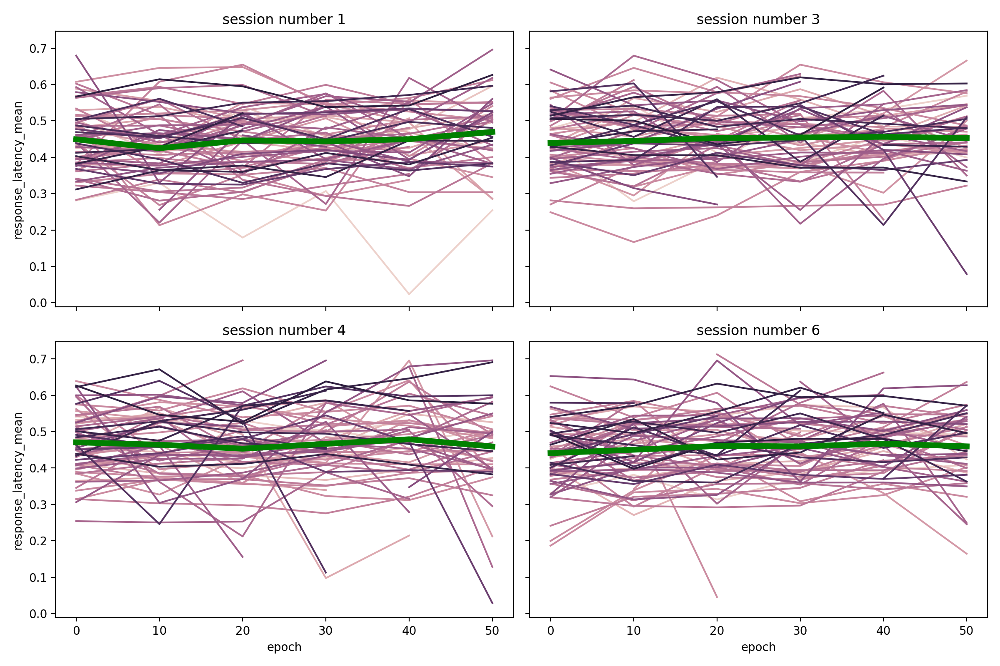

In [230]:
fig, ax = plt.subplots(2,2,figsize = (12, 8), sharex=True, sharey=True)
for ii, session_number in enumerate([1,3,4,6]):
    sns.lineplot(
        data=rdf.query('session_number == @session_number'), 
        x="epoch", 
        y="response_latency_mean", 
        hue="mouse_id",
        ax = ax.flatten()[ii],
        ci=False,
        legend = False
    )
    
    sns.lineplot(
        data=rdf.query('session_number == @session_number'), 
        x="epoch", 
        y="response_latency_mean", 
        ax = ax.flatten()[ii],
        ci=False,
        legend = False,
        linewidth = 5,
        color = 'green'
    )
    
    ax.flatten()[ii].set_title('session number {}'.format(session_number))
fig.tight_layout()

<IPython.core.display.Javascript object>


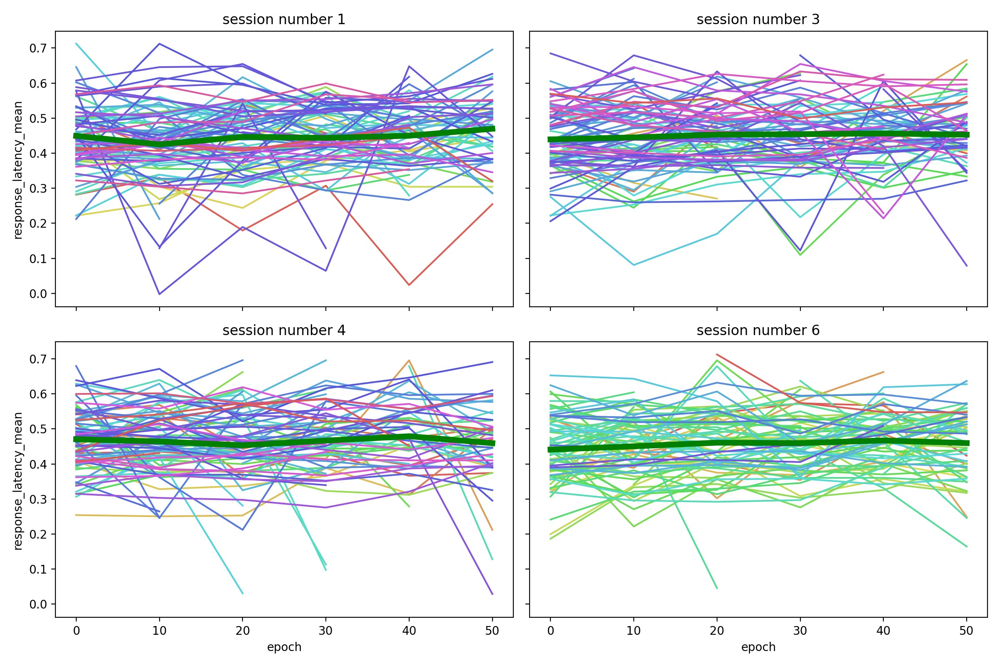

In [231]:
fig, ax = plt.subplots(2,2,figsize = (12, 8), sharex=True, sharey=True)
for ii, session_number in enumerate([1,3,4,6]):
    sns.lineplot(
        data=rdf.query('session_number == @session_number'), 
        x="epoch", 
        y="response_latency_mean", 
        hue="strategy_dropout_index",
        ax = ax.flatten()[ii],
        ci=False,
        legend = False,
        palette = 'hls'
    )
    
    sns.lineplot(
        data=rdf.query('session_number == @session_number'), 
        x="epoch", 
        y="response_latency_mean", 
        ax = ax.flatten()[ii],
        ci=False,
        legend = False,
        linewidth = 5,
        color = 'green'
    )
    
    ax.flatten()[ii].set_title('session number {}'.format(session_number))
fig.tight_layout()

<IPython.core.display.Javascript object>


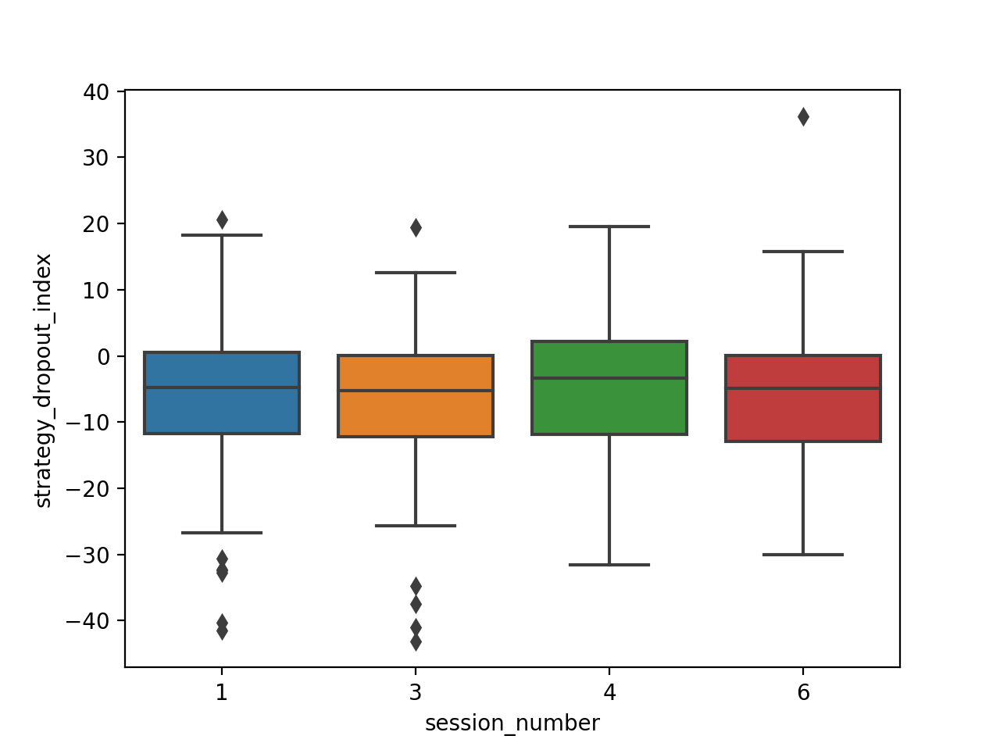

<AxesSubplot:xlabel='session_number', ylabel='strategy_dropout_index'>

In [232]:
fig, ax = plt.subplots()
sns.boxplot(
    data = rdf.drop_duplicates(subset = 'behavior_session_id'),
    x = 'session_number',
    y = 'strategy_dropout_index'
)